## 📘 Merged Liverpool Analysis Notebook

In [2]:
# 📂 1. Import libraries
import pandas as pd

# 📂 2. Load your CSV — adjust the file name if needed
df = pd.read_csv('premier-league-matches.csv')

# 📂 3. Filter Season_End_Year between 2015 and 2023
df_filtered = df[(df['Season_End_Year'] >= 2015) & (df['Season_End_Year'] <= 2023)]

# 📂 4. Keep rows where Liverpool is Home or Away
df_liverpool = df_filtered[
    (df_filtered['Home'] == 'Liverpool') | (df_filtered['Away'] == 'Liverpool')
]

# 📂 5. Drop the 'Wk' column
df_liverpool = df_liverpool.drop(columns=['Wk'])
df_liverpool = df_liverpool.drop(columns=['FTR'])

# 📂 6. Save to a new CSV file
output_file = 'Liverpool_2015_2023_Matches.csv'
df_liverpool.to_csv(output_file, index=False)

print(f'✅ Done! Filtered file saved as: {output_file}')


FileNotFoundError: [Errno 2] No such file or directory: 'premier-league-matches.csv'

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio

# 1️⃣ Load your CSV
df = pd.read_csv('Liverpool_2015_2023_Matches.csv')

# 2️⃣ Add Venue column
df['Venue'] = df.apply(lambda row: 'Home' if row['Home'] == 'Liverpool' else 'Away', axis=1)

# 3️⃣ Add Result column
def get_result(row):
    if row['Venue'] == 'Home':
        if row['HomeGoals'] > row['AwayGoals']:
            return 'Win'
        elif row['HomeGoals'] == row['AwayGoals']:
            return 'Draw'
        else:
            return 'Loss'
    else:
        if row['AwayGoals'] > row['HomeGoals']:
            return 'Win'
        elif row['AwayGoals'] == row['HomeGoals']:
            return 'Draw'
        else:
            return 'Loss'
df['Result'] = df.apply(get_result, axis=1)

# 4️⃣ Create Summary Table
summary = df.groupby('Venue').agg(
    Total_Matches=('Result', 'count'),
    Wins=('Result', lambda x: (x == 'Win').sum())
).reset_index()

summary['Win_Percentage'] = (summary['Wins'] / summary['Total_Matches'] * 100).round(1)

# 5️⃣ SINGLE BAR CHART: Wins only
fig1 = px.bar(
    summary,
    x='Venue',
    y='Wins',
    text='Wins',
    color='Venue',
    color_discrete_map={'Home': 'red', 'Away': 'green'},
    labels={'Wins': 'Number of Wins', 'Venue': 'Venue'},
    template='plotly_white',
    title=f"⚽ Liverpool Wins (2015–2023) — Home vs Away<br>Total Games: {summary['Total_Matches'].sum()}"
)

fig1.update_traces(
    textposition='outside',
    customdata=summary[['Total_Matches', 'Win_Percentage']].values,
    hovertemplate='<b>Venue:</b> %{x}<br>' +
                  '<b>Wins:</b> %{y}<br>' +
                  '<b>Total Games:</b> %{customdata[0]}<br>' +
                  '<b>Win %:</b> %{customdata[1]}%'
)
fig1.update_layout(
    title_font=dict(size=22),
    xaxis_title='Venue',
    yaxis_title='Number of Wins',
    xaxis=dict(title_font=dict(size=18)),
    yaxis=dict(title_font=dict(size=18)),
    showlegend=False
)
fig1.show()

# 6️⃣ GROUPED BAR CHART: Wins vs Total
summary_melted = summary.melt(id_vars='Venue', value_vars=['Total_Matches', 'Wins'])

fig2 = px.bar(
    summary_melted,
    x='Venue',
    y='value',
    color='variable',
    barmode='group',
    text='value',
    title='⚽ Liverpool (2015–2023): Matches Played vs Wins (Home & Away)',
    labels={'value': 'Number of Matches', 'Venue': 'Venue', 'variable': 'Metric'},
    color_discrete_map={'Total_Matches': 'royalblue', 'Wins': 'crimson'},
    template='plotly_white'
)

fig2.update_traces(textposition='outside')
fig2.update_layout(
    title_font=dict(size=22),
    xaxis=dict(title_font=dict(size=18)),
    yaxis=dict(title_font=dict(size=18)),
    legend_title_text='Metric'
)
fig2.show()
pio.write_image(fig1, "liverpool_wins_home_away.png", width=1000, height=600)
pio.write_image(fig2, "liverpool_matches_vs_wins_grouped.png", width=1000, height=600)

In [ ]:


import pandas as pd
import plotly.express as px
import plotly.io as pio

# 1️⃣ Load the CSV
df = pd.read_csv("Liverpool_2015_2023_Matches.csv")

# 2️⃣ Add Venue column
df['Venue'] = df.apply(lambda row: 'Home' if row['Home'] == 'Liverpool' else 'Away', axis=1)

# 3️⃣ Add Result column
def get_result(row):
    if row['Venue'] == 'Home':
        return 'Win' if row['HomeGoals'] > row['AwayGoals'] else 'Draw' if row['HomeGoals'] == row['AwayGoals'] else 'Loss'
    else:
        return 'Win' if row['AwayGoals'] > row['HomeGoals'] else 'Draw' if row['AwayGoals'] == row['HomeGoals'] else 'Loss'
df['Result'] = df.apply(get_result, axis=1)

# 4️⃣ Add CovidPeriod column
df['Date'] = pd.to_datetime(df['Date'])
def covid_period(date):
    if date < pd.to_datetime('2020-03-01'):
        return 'Pre-COVID'
    elif date < pd.to_datetime('2021-07-01'):
        return 'During COVID'
    else:
        return 'Post-COVID'
df['CovidPeriod'] = df['Date'].apply(covid_period)

# 5️⃣ Group and summarize data
summary = df.groupby(['CovidPeriod', 'Venue', 'Result']).size().reset_index(name='Count')
summary['Result_Grouped'] = summary['Result'].apply(lambda x: 'Wins' if x == 'Win' else 'Other')
stacked = summary.groupby(['CovidPeriod', 'Venue', 'Result_Grouped'])['Count'].sum().reset_index()

# 6️⃣ Modern stacked bar chart
fig = px.bar(
    stacked,
    x='Venue',
    y='Count',
    color='Result_Grouped',
    barmode='stack',
    facet_col='CovidPeriod',
    color_discrete_map={'Wins': '#D7263D', 'Other': '#7F7F7F'},
    title='⚽ Liverpool Results by Venue & COVID Period (2015–2023)',
    labels={'Count': 'Matches', 'Venue': 'Venue', 'Result_Grouped': 'Outcome'},
    template='plotly_white'
)

# 7️⃣ Layout and style updates
fig.update_layout(
    font=dict(family='Segoe UI', size=14),
    title_font=dict(size=24, color='#1f1f1f'),
    legend=dict(title='Outcome', orientation='h', yanchor='bottom', y=-0.2, xanchor='center', x=0.5),
    margin=dict(t=80, b=80),
    plot_bgcolor='white',
    paper_bgcolor='white'
)

# 8️⃣ Trace styling
fig.update_traces(
    marker_line_width=1.5,
    marker_line_color='white',
    textposition='inside',
    hovertemplate='<b>Venue:</b> %{x}<br>' +
                  '<b>Outcome:</b> %{legendgroup}<br>' +
                  '<b>Matches:</b> %{y}<extra></extra>'
)

# 9️⃣ Show and Save
fig.show()

# Save as PNG
pio.write_image(fig, "liverpool_covid_stacked_modern.png", width=1200, height=600)


In [ ]:
import pandas as pd

# 1️⃣ Load your CSV
df = pd.read_csv('EPL_Set.csv')  # or your latest file name

# 2️⃣ Drop rows with missing Home/Away teams or final scores
df = df.dropna(subset=['HomeTeam', 'AwayTeam', 'FTHG', 'FTAG'])

# 3️⃣ Filter: Keep only rows where Liverpool is Home OR Away
df = df[(df['HomeTeam'] == 'Liverpool') | (df['AwayTeam'] == 'Liverpool')]

# 4️⃣ Convert Date column to real dates (DD/MM/YY format in your file)
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True, format='%d/%m/%y', errors='coerce')


# 5️⃣ Filter by Date: Only keep matches from 2015 onwards
df = df[df['Date'].dt.year >= 2015]

# 6️⃣ Drop half-time goal columns if they exist
for col in ['HTHG', 'HTAG', 'HTR']:
    if col in df.columns:
        df = df.drop(columns=[col])

# 7️⃣ Add Venue column (Home/Away for Liverpool)
df['Venue'] = df.apply(lambda row: 'Home' if row['HomeTeam'] == 'Liverpool' else 'Away', axis=1)

# 8️⃣ Add Result column (Win/Draw/Loss from Liverpool's view)
def get_result(row):
    if row['Venue'] == 'Home':
        if row['FTHG'] > row['FTAG']:
            return 'Win'
        elif row['FTHG'] == row['FTAG']:
            return 'Draw'
        else:
            return 'Loss'
    else:
        if row['FTAG'] > row['FTHG']:
            return 'Win'
        elif row['FTAG'] == row['FTHG']:
            return 'Draw'
        else:
            return 'Loss'

df['Result'] = df.apply(get_result, axis=1)

# 9️⃣ Add CovidPeriod column
def covid_period(date):
    if pd.isnull(date):
        return 'Unknown'
    elif date < pd.to_datetime('2020-03-01'):
        return 'Pre-COVID'
    elif date < pd.to_datetime('2021-07-01'):
        return 'During COVID'
    else:
        return 'Post-COVID'

df['CovidPeriod'] = df['Date'].apply(covid_period)

# ✅ Done: check result
df.head()

# 🔟 (Optional) Save your filtered file
df.to_csv('Liverpool_Filtered_2015_onwards.csv', index=False)


In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio

# 📂 Load dataset
df = pd.read_csv('Liverpool_Filtered_2015_onwards.csv')

# 📌 Rename columns (if needed)
rename_columns = {
    'Div': 'Division',
    'Date': 'Date',
    'HomeTeam': 'HomeTeam',
    'AwayTeam': 'AwayTeam',
    'FTHG': 'FullTimeHomeGoals',
    'FTAG': 'FullTimeAwayGoals',
    'FTR': 'FullTimeResult',
    'Season': 'Season'
}
df = df.rename(columns=rename_columns)

# 🏠 Add Venue column
df['Venue'] = df.apply(lambda row: 'Home' if row['HomeTeam'] == 'Liverpool' else 'Away', axis=1)

# 📅 Date parsing + COVID period
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
def covid_period(date):
    if pd.isnull(date): return 'Unknown'
    elif date < pd.to_datetime('2020-03-01'): return 'Pre-COVID'
    elif date < pd.to_datetime('2021-07-01'): return 'During COVID'
    else: return 'Post-COVID'
df['CovidPeriod'] = df['Date'].apply(covid_period)

# 🏁 Result column from FTR
df['Result'] = df['FullTimeResult'].map({'H': 'Win', 'D': 'Draw', 'A': 'Loss'})
df.loc[df['Venue'] == 'Away', 'Result'] = df['FullTimeResult'].map({'A': 'Win', 'D': 'Draw', 'H': 'Loss'})

# 📊 Plot 1: Wins Home vs Away
wins = df[df['Result'] == 'Win'].groupby('Venue').size().reset_index(name='Wins')
fig1 = px.bar(
    wins, x='Venue', y='Wins', text='Wins', color='Venue',
    title='🏠 Liverpool Wins (Home vs Away)',
    color_discrete_map={'Home': '#FF4136', 'Away': '#2ECC40'},
    template='plotly_white'
)
fig1.update_traces(marker_line_color='white', marker_line_width=1.5, textposition='outside')
fig1.update_layout(font=dict(size=14), title_font=dict(size=24))
pio.write_image(fig1, "wins_home_away.png", width=1000, height=600)
fig1.show()



# 📊 Plot 2: 100% Stacked Result %
outcome = df.groupby(['Venue', 'Result']).size().reset_index(name='Count')
outcome['Percent'] = outcome['Count'] / outcome.groupby('Venue')['Count'].transform('sum') * 100
fig2 = px.bar(
    outcome, x='Venue', y='Percent', color='Result', text=outcome['Percent'].round(1),
    barmode='stack', title='⚖️ Result % Breakdown (Home vs Away)',
    color_discrete_sequence=px.colors.qualitative.Safe, template='plotly_white'
)
fig2.update_layout(font=dict(size=14), title_font=dict(size=24))
pio.write_image(fig2, "result_percent_stacked.png", width=1000, height=600)
fig2.show()

# 📊 Plot 3: COVID Result Breakdown
covid_outcome = df.groupby(['CovidPeriod', 'Venue', 'Result']).size().reset_index(name='Count')
fig3 = px.bar(
    covid_outcome, x='Venue', y='Count', color='Result', barmode='stack',
    facet_col='CovidPeriod', title='🦠 Result Breakdown by Venue & COVID Period',
    color_discrete_sequence=px.colors.qualitative.Bold, template='plotly_white'
)
fig3.update_layout(font=dict(size=14), title_font=dict(size=24))
pio.write_image(fig3, "result_covid_venue.png", width=1200, height=600)
fig3.show()

# 📊 Plot 4: Wins Over Time
df['Year'] = df['Date'].dt.year
wins_time = df[df['Result'] == 'Win'].groupby(['Year', 'Venue']).size().reset_index(name='Wins')
fig4 = px.line(
    wins_time, x='Year', y='Wins', color='Venue', markers=True,
    title='📈 Liverpool Wins Over Time (Home vs Away)',
    color_discrete_map={'Home': '#FF4136', 'Away': '#2ECC40'},
    template='plotly_white'
)
fig4.update_layout(font=dict(size=14), title_font=dict(size=24))
pio.write_image(fig4, "wins_over_time.png", width=1000, height=600)
fig4.show()

# 📊 Plot 5: Goals Box Plot
df['GoalsFor'] = df.apply(lambda row: row['FullTimeHomeGoals'] if row['Venue'] == 'Home' else row['FullTimeAwayGoals'], axis=1)
fig5 = px.box(
    df, x='Venue', y='GoalsFor', points='all',
    title='🎯 Goals Scored per Match (Home vs Away)',
    color='Venue',
    color_discrete_map={'Home': '#FF4136', 'Away': '#2ECC40'},
    template='plotly_white'
)
fig5.update_layout(font=dict(size=14), title_font=dict(size=24))
pio.write_image(fig5, "boxplot_goals.png", width=1000, height=600)
fig5.show()







In [ ]:


import pandas as pd
import plotly.express as px
import plotly.io as pio

# Optional: Force plot display in Jupyter
pio.renderers.default = 'notebook'  # or 'iframe', 'svg' if needed

# 📂 Load dataset
df = pd.read_csv('EPL_result.csv')

# 🧮 Group by home team: average xG and actual goals
home_stats = df.groupby('Home').agg(
    Avg_xG_Home=('xG_Home', 'mean'),
    Avg_G_Home=('G_Home', 'mean')
).reset_index()

# 🔁 Melt for grouped bar
home_stats_melted = home_stats.melt(
    id_vars='Home',
    value_vars=['Avg_xG_Home', 'Avg_G_Home'],
    var_name='Metric',
    value_name='Goals'
)

# 🟥 Add highlighting (Liverpool bold)
home_stats_melted['Highlight'] = home_stats_melted['Home'].apply(lambda x: 'Liverpool' if x == 'Liverpool' else 'Other')

# 🖼️ Plot with enhanced design
fig = px.bar(
    home_stats_melted,
    x='Home',
    y='Goals',
    color='Metric',
    barmode='group',
    text='Goals',
    title='⚽ Average Home xG vs Actual Goals per Team (Highlight: Liverpool)',
    template='plotly_white',
    color_discrete_map={
        'Avg_xG_Home': '#1f77b4',  # royal blue
        'Avg_G_Home': '#d62728'   # crimson red
    }
)

# ✏️ Aesthetic improvements
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside',
    marker_line_color='white',
    marker_line_width=1.2
)
fig.update_layout(
    xaxis_title='Club (Home Games)',
    yaxis_title='Goals (Average)',
    font=dict(size=14),
    title_font=dict(size=22),
    xaxis_tickangle=45,
    bargap=0.25
)

# 🔍 Optional: Sort by Avg_G_Home if needed
home_stats_melted.sort_values(by='Goals', ascending=False, inplace=True)

# ✅ Show plot
fig.show()

# 💾 Save as PNG (requires kaleido)
pio.write_image(fig, "home_xg_vs_goals_liverpool_highlight.png", width=1200, height=700)


In [ ]:

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#import dataframe_image as dfi
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df=pd.read_csv('EPL_result.csv')

#Name to abbreviation
team_abb={'Everton':'EVE', 'Aston Villa':'AVL',
          'Leicester City':'LEI', 'Arsenal':'ARS',
          'Liverpool':'LIV','Tottenham':'TOT', 
          'Chelsea':'CHE', 'Leeds United':'LEE', 
          'Newcastle Utd':'NEW','West Ham':'WHU', 
          'Southampton':'SOU', 'Crystal Palace':'CRY', 
          'Wolves':'WOL','Manchester City':'MCI', 
          'Brighton':'BHA', 'Manchester Utd':'MUN', 
          'West Brom':'WBA','Burnley':'BUR', 
          'Sheffield Utd':'SHU', 'Fulham':'FUL'}
df.Home=df.Home.apply(lambda x: team_abb[x])
df.Away=df.Away.apply(lambda x: team_abb[x])

df['GD']=df.G_Home-df.G_Away
df['Pts_Home']=df.GD.apply(lambda x : 3 if x>0 else (0 if x<0 else 1))
df['Pts_Away']=df.GD.apply(lambda x : 0 if x>0 else (3 if x<0 else 1))
df.head()

,GW,Home,Away,xG_Home,xG_Away,G_Home,G_Away,GD,Pts_Home,Pts_Away
0,1,FUL,ARS,0.2,1.8,0.0,3.0,-3.0,0,3
1,1,CRY,SOU,0.7,0.8,1.0,0.0,1.0,3,0
2,1,LIV,LEE,3.3,0.6,4.0,3.0,1.0,3,0
3,1,WHU,NEW,1.1,1.5,0.0,2.0,-2.0,0,3
4,1,WBA,LEI,0.5,2.2,0.0,3.0,-3.0,0,3


In [ ]:

gw_last=7        #Last Gameweek number to be updated
gw_next=gw_last+1


In [ ]:
df_temp=pd.DataFrame({'Team':list(team_abb.values())})
df_temp['M_h']=df_temp.Team\
.apply(lambda x:df[df.Home==x][df.GW<gw_next].count()[0])

df_temp['M_a']=df_temp.Team\
.apply(lambda x:df[df.Away==x][df.GW<gw_next].count()[0])

df_temp['M']=df_temp.M_h+df_temp.M_a

df_temp['xG_h']=df_temp.Team\
.apply(lambda x:df.xG_Home[df.Home==x][df.GW<gw_next].sum())

df_temp['xG_a']=df_temp.Team\
.apply(lambda x:df.xG_Away[df.Away==x][df.GW<gw_next].sum())

df_temp['xG']=df_temp.xG_a+df_temp.xG_h

df_temp['xGpm_h']=df_temp.xG_h/df_temp.M_h
df_temp['xGpm_a']=df_temp.xG_a/df_temp.M_a
df_temp['xGpm']=df_temp.xG/df_temp.M

df_temp['xGA_h']=df_temp.Team\
.apply(lambda x:df.xG_Away[df.Home==x][df.GW<gw_next].sum())

df_temp['xGA_a']=df_temp.Team\
.apply(lambda x:df.xG_Home[df.Away==x][df.GW<gw_next].sum())

df_temp['xGA']=df_temp.xGA_a+df_temp.xGA_h

df_temp['xGApm_h']=df_temp.xGA_h/df_temp.M_h
df_temp['xGApm_a']=df_temp.xGA_a/df_temp.M_a
df_temp['xGApm']=df_temp.xGA/df_temp.M

df_temp['delta_xGpm']=df_temp.xGpm-df_temp.xGApm


df_temp['P_h']=df_temp.Team\
.apply(lambda x:df.Pts_Home[df.Home==x][df.GW<gw_next].sum())

df_temp['P_a']=df_temp.Team\
.apply(lambda x:df.Pts_Away[df.Away==x][df.GW<gw_next].sum())

df_temp['P']=df_temp.P_a+df_temp.P_h

df_temp['Ppm_h']=df_temp.P_h/df_temp.M_h
df_temp['Ppm_a']=df_temp.P_a/df_temp.M_a
df_temp['Ppm']=df_temp.P/df_temp.M

df_temp['G_h']=df_temp.Team\
.apply(lambda x:df.G_Home[df.Home==x][df.GW<gw_next].sum())

df_temp['G_a']=df_temp.Team\
.apply(lambda x:df.G_Away[df.Away==x][df.GW<gw_next].sum())

df_temp['G']=df_temp.G_a+df_temp.G_h

df_temp['GA_h']=df_temp.Team\
.apply(lambda x:df.G_Away[df.Home==x][df.GW<gw_next].sum())

df_temp['GA_a']=df_temp.Team\
.apply(lambda x:df.G_Home[df.Away==x][df.GW<gw_next].sum())

df_temp['GA']=df_temp.GA_a+df_temp.GA_h

df_temp['GD']=df_temp.G-df_temp.GA
df_temp['delta_xG_ha']=df_temp.xG_h-df_temp.xG_a
df_temp['delta_xGA_ha']=df_temp.xGA_h-df_temp.xGA_a

In [ ]:

df_temp[['Team','M','P','GD','G','GA' ]].sort_values(by=['P','GD','G'], ascending=False)\
.style.background_gradient(cmap='RdYlGn',subset=['G','GA'])

,Team,M,P,GD,G,GA
4,LIV,7,16,2.000000,17.000000,15.000000
2,LEI,7,15,8.000000,17.000000,9.000000
5,TOT,7,14,9.000000,18.000000,9.000000
0,EVE,7,13,4.000000,15.000000,11.000000
10,SOU,7,13,2.000000,14.000000,12.000000
12,WOL,7,13,0.000000,8.000000,8.000000
6,CHE,7,12,7.000000,16.000000,9.000000
1,AVL,6,12,6.000000,15.000000,9.000000
3,ARS,7,12,2.000000,9.000000,7.000000
13,MCI,6,11,1.000000,9.000000,8.000000


In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

# Optional: set default renderer if needed
pio.renderers.default = 'notebook'

# Sort the teams
df_temp = df_temp.sort_values(by='xGpm', ascending=False)

# ===============================
# 1️⃣ Horizontal Bar Chart (xG and xGA side-by-side)
# ===============================
fig1 = go.Figure()

fig1.add_trace(go.Bar(
    x=df_temp['xGpm'],
    y=df_temp['Team'],
    name='xG per Match',
    orientation='h',
    marker=dict(color='crimson'),
    hovertemplate='Team: %{y}<br>xG: %{x}<extra></extra>'
))

fig1.add_trace(go.Bar(
    x=df_temp['xGApm'],
    y=df_temp['Team'],
    name='xGA per Match',
    orientation='h',
    marker=dict(color='dodgerblue'),
    hovertemplate='Team: %{y}<br>xGA: %{x}<extra></extra>'
))

fig1.update_layout(
    title='⚽ EPL 2020/21: xG vs xGA per Match (Side-by-Side)',
    barmode='group',
    yaxis=dict(autorange="reversed"),
    template='plotly_white',
    height=700
)

fig1.write_image("plot_xg_vs_xga_horizontal.png", scale=3)
fig1.show()

# ===============================
# 2️⃣ Grouped Vertical Bar Chart
# ===============================
df_grouped = df_temp[['Team', 'xGpm', 'xGApm']].melt(id_vars='Team', var_name='Metric', value_name='PerMatch')

fig2 = px.bar(
    df_grouped,
    x='Team',
    y='PerMatch',
    color='Metric',
    barmode='group',
    title='⚽ EPL 2020/21: xG vs xGA per Match (Grouped)',
    template='plotly_white',
    color_discrete_map={'xGpm': 'crimson', 'xGApm': 'dodgerblue'},
    labels={'PerMatch': 'Per Match Value'}
)

fig2.update_layout(
    xaxis_tickangle=-45,
    height=600
)

fig2.write_image("plot_xg_vs_xga_grouped.png", scale=3)
fig2.show()

# ===============================
# 3️⃣ Dot Plot (Lollipop Style)
# ===============================
fig3 = go.Figure()

for i, row in df_temp.iterrows():
    fig3.add_trace(go.Scatter(
        x=[row['xGApm'], row['xGpm']],
        y=[row['Team'], row['Team']],
        mode='lines',
        line=dict(color='gray', width=2),
        hoverinfo='skip',
        showlegend=False
    ))
    fig3.add_trace(go.Scatter(
        x=[row['xGApm']],
        y=[row['Team']],
        mode='markers',
        marker=dict(color='dodgerblue', size=12),
        name='xGA' if i == 0 else None,
        hovertemplate='Team: %{y}<br>xGA: %{x}<extra></extra>'
    ))
    fig3.add_trace(go.Scatter(
        x=[row['xGpm']],
        y=[row['Team']],
        mode='markers',
        marker=dict(color='crimson', size=12),
        name='xG' if i == 0 else None,
        hovertemplate='Team: %{y}<br>xG: %{x}<extra></extra>'
    ))

fig3.update_layout(
    title="⚽ EPL 2020/21: xG vs xGA per Match (Dot Plot)",
    template="plotly_white",
    xaxis_title="Per Match Value",
    height=800
)

fig3.write_image("plot_xg_vs_xga_dotplot.png", scale=3)
fig3.show()


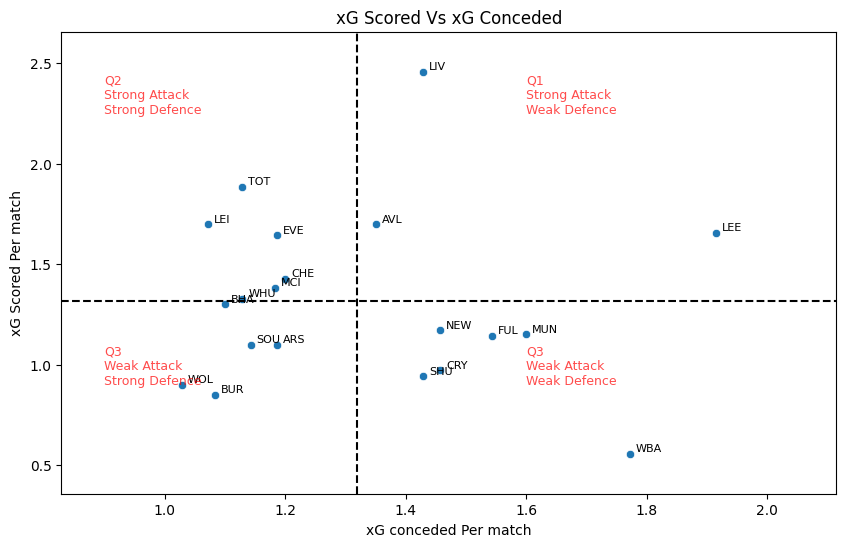

In [ ]:
plt.figure(figsize=(10,6))
plt.title("xG Scored Vs xG Conceded")
sns.scatterplot(data=df_temp, x='xGApm', y='xGpm')
for i in range(df_temp.shape[0]):
    plt.text(df_temp.xGApm[i]+0.01, df_temp.xGpm[i]+0.01, 
             df_temp.Team[i], fontdict={'fontsize':8})
plt.xlabel("xG conceded Per match")
plt.ylabel("xG Scored Per match")
#plt.plot([0,3],[0,3],'r--')
plt.xlim(df_temp.xGApm.min()-0.2,df_temp.xGApm.max()+0.2)
plt.ylim(df_temp.xGpm.min()-0.2,df_temp.xGpm.max()+0.2)
plt.axhline(y=df_temp.xGpm.mean(),ls='--', color='k')
plt.axvline(x=df_temp.xGApm.mean(),ls='--', color='k')

plt.text(x=1.6, y=2.25, s="Q1\nStrong Attack\nWeak Defence", 
         alpha=0.7,fontsize=9, color='red')
plt.text(x=0.9, y=2.25, s="Q2\nStrong Attack\nStrong Defence", 
         alpha=0.7,fontsize=9, color='red')
plt.text(x=0.9, y=0.9, s="Q3\nWeak Attack\nStrong Defence", 
         alpha=0.7,fontsize=9, color='red')
plt.text(x=1.6, y=0.9, s="Q3\nWeak Attack\nWeak Defence", 
         alpha=0.7,fontsize=9, color='red')

plt.savefig('scatter_xg_xa.png')
plt.show()

In [ ]:

import plotly.express as px
import plotly.io as pio

# Sort by delta_xGpm for ranking
df_sorted = df_temp.sort_values(by='delta_xGpm', ascending=False)

# Create interactive horizontal bar chart
fig = px.bar(
    df_sorted,
    x='delta_xGpm',
    y='Team',
    orientation='h',
    text='delta_xGpm',
    title='⚽ EPL 2020/21: Delta xG (Scored - Conceded)',
    labels={'delta_xGpm': 'Delta xG per Match', 'Team': 'Team'},
    template='plotly_white',
    color='delta_xGpm',
    color_continuous_scale='RdYlGn'
)

# Customize layout
fig.update_traces(
    texttemplate='%{x:.2f}',
    textposition='outside'
)
fig.update_layout(
    xaxis_title='ΔxG per Match',
    yaxis=dict(autorange='reversed'),
    title_font=dict(size=20),
    coloraxis_showscale=False,
    margin=dict(t=60, b=40)
)

# ✅ Show interactive chart
fig.show()

# ✅ Save as PNG (requires kaleido)
fig.write_image("delta_xg_bar.png", scale=3)


In [ ]:



import plotly.graph_objects as go
import plotly.io as pio

# Sort by home xG for consistent ordering
df_temp = df_temp.sort_values(by='xG_h', ascending=False)

# ================================
# 📊 Interactive Horizontal Bar Charts: xG Home vs Away
# ================================
fig = go.Figure()

# xG Home
fig.add_trace(go.Bar(
    x=df_temp['xG_h'],
    y=df_temp['Team'],
    name='xG at Home',
    orientation='h',
    marker=dict(color='firebrick'),
    hovertemplate='Team: %{y}<br>xG at Home: %{x}<extra></extra>'
))

# xG Away
fig.add_trace(go.Bar(
    x=df_temp['xG_a'],
    y=df_temp['Team'],
    name='xG Away',
    orientation='h',
    marker=dict(color='darkblue'),
    hovertemplate='Team: %{y}<br>xG Away: %{x}<extra></extra>'
))

fig.update_layout(
    title='⚽ EPL 2020/21: xG Scored per Match — Home vs Away',
    barmode='group',
    yaxis=dict(autorange="reversed"),
    template='plotly_white',
    xaxis_title='xG per Match',
    height=700
)

# ✅ Show interactive chart
fig.show()

# ✅ Save as PNG (optional — requires kaleido)
fig.write_image("xg_home_vs_away.png", scale=3)


In [ ]:
import plotly.express as px
import plotly.io as pio

# Sort for visual clarity
df_sorted = df_temp.sort_values(by='delta_xG_ha', ascending=False)

# Create interactive bar chart
fig = px.bar(
    df_sorted,
    x='delta_xG_ha',
    y='Team',
    orientation='h',
    title='⚽ EPL 2020/21: xG Difference (Home - Away)',
    labels={'delta_xG_ha': 'ΔxG (Home - Away)', 'Team': 'Team'},
    template='plotly_white',
    text='delta_xG_ha',
    color='delta_xG_ha',
    color_continuous_scale='RdBu'
)

# Beautify the display
fig.update_traces(
    texttemplate='%{x:.2f}',
    textposition='outside'
)
fig.update_layout(
    xaxis_title='xG Difference (Home - Away)',
    yaxis=dict(autorange='reversed'),
    coloraxis_showscale=False,
    title_font=dict(size=20),
    margin=dict(t=60, b=40)
)

# Show plot
fig.show()

# Save to PNG
fig.write_image("delta_xG_home_away_bar.png", scale=3)


In [ ]:
df['xG_diff'] = df['xG_Home'] - df['xG_Away']
team_xg_diff = df.groupby('Home')['xG_diff'].mean().sort_values(ascending=False).reset_index()

fig = px.bar(team_xg_diff, x='Home', y='xG_diff',
             title='📊 Average xG Difference (Home Teams)',
             template='plotly_white')
fig.show()
fig.write_image("average_xg_difference_home_teams.png")

In [ ]:

import plotly.express as px


stats_df = pd.read_csv("stats.csv")

# Filter only Liverpool data
liverpool_stats = stats_df[stats_df['team'] == 'Liverpool']

# Select relevant columns
liverpool_stats = liverpool_stats[['season', 'total_scoring_att', 'ontarget_scoring_att', 'goals', 'wins']]

# Melt for plotting
liverpool_melted = liverpool_stats.melt(id_vars='season', var_name='Metric', value_name='Value')

# Create interactive line chart
fig = px.line(
    liverpool_melted,
    x='season',
    y='Value',
    color='Metric',
    markers=True,
    title='Liverpool Performance by Season: Shots, Shots on Target, Goals, Wins',
    labels={'Value': 'Count', 'season': 'Season'},
    template='plotly_white'
)

# 🔧 Fix layout margins
fig.update_layout(
    title_font=dict(size=22),
    legend_title_text='Metric',
    margin=dict(l=60, r=60, t=80, b=60)  # Prevent cropping
)

# 📏 Save with larger dimensions
fig.write_image("Liverpool Performance by Season.png", width=1000, height=600)

# Show the chart
fig.show()



In [ ]:
import pandas as pd
import plotly.express as px

# Load manager data
managers_df = pd.read_csv("liverpoolfc_managers.csv", sep=';')

# Convert date strings
managers_df['From'] = pd.to_datetime(managers_df['From'])
managers_df['To'] = pd.to_datetime(managers_df['To'])

# Calculate duration
managers_df['Days'] = (managers_df['To'] - managers_df['From']).dt.days
managers_df['Years'] = (managers_df['Days'] / 365).round(1)

# Sort chronologically
managers_df = managers_df.sort_values(by='From')

# Create horizontal bar chart
fig = px.bar(
    managers_df,
    x='Years',
    y='Name',
    color='win_perc',
    text='win_perc',
    orientation='h',
    title="🔴 Liverpool Managers: Tenure Duration vs Win %",
    labels={'Years': 'Years in Charge', 'win_perc': 'Win %'},
    color_continuous_scale='RdYlGn',
    template='plotly_white'
)

fig.update_layout(
    xaxis_title='Years Managed',
    yaxis_title='Manager',
    coloraxis_colorbar=dict(title="Win %"),
    height=700
)

fig.show()
fig.write_image("manager.png")

In [ ]:

import pandas as pd
import plotly.express as px

# Load manager data
managers_df = pd.read_csv("liverpoolfc_managers.csv", sep=';')

# Convert date strings
managers_df['From'] = pd.to_datetime(managers_df['From'])
managers_df['To'] = pd.to_datetime(managers_df['To'])

# Calculate duration
managers_df['Days'] = (managers_df['To'] - managers_df['From']).dt.days
managers_df['Years'] = (managers_df['Days'] / 365).round(1)

# Sort by start date
managers_df = managers_df.sort_values(by='From')

# 📈 Plot 1: Win % Over Time
fig1 = px.line(
    managers_df,
    x='From',
    y='win_perc',
    text='Name',
    markers=True,
    title='📈 Liverpool Managers Over Time: Win % Trend',
    labels={'From': 'Start Year', 'win_perc': 'Win Percentage'},
    template='plotly_white'
)
fig1.update_traces(textposition='top center', marker=dict(size=10, color='red'))
fig1.update_layout(
    title_font=dict(size=22),
    margin=dict(l=60, r=60, t=80, b=60),
    xaxis_tickformat='%Y',
    xaxis_title='Start Year',
    yaxis_title='Win Percentage (%)',
    hovermode='x unified'
)
fig1.write_image("liverpool_managers_win_trend.png", width=1000, height=600)
fig1.show()

# 🔵 Plot 2: Win % vs Games Managed (Bubble = Tenure)
fig2 = px.scatter(
    managers_df,
    x='P',  # Number of games played
    y='win_perc',
    size='Years',
    color='win_perc',
    text='Name',
    title='⚽ Win % vs Games Managed (Bubble = Tenure)',
    labels={'P': 'Games Managed', 'win_perc': 'Win %', 'Years': 'Tenure (Years)'},
    color_continuous_scale='Blues',
    template='plotly_white'
)
fig2.update_traces(textposition='top center')
fig2.update_layout(
    title_font=dict(size=22),
    margin=dict(l=60, r=60, t=80, b=60),
    xaxis_title='Games Managed',
    yaxis_title='Win Percentage (%)',
    hovermode='closest'
)
fig2.write_image("liverpool_managers_bubble.png", width=1000, height=600)
fig2.show()

# 🥧 Plot 3: Share of Total Matches Managed
fig3 = px.pie(
    managers_df,
    names='Name',
    values='P',
    title='🧩 Games Managed by Each Liverpool Manager',
    template='plotly_white',
    hole=0.3  # Donut style
)
fig3.update_traces(
    textposition='inside',
    textinfo='percent+label',
    pull=[0.05]*len(managers_df)  # Slight pull to enhance visibility
)
fig3.update_layout(
    title_font=dict(size=22),
    margin=dict(l=60, r=60, t=80, b=60)
)
fig3.write_image("liverpool_managers_pie.png", width=800, height=600)
fig3.show()


In [ ]:

import pandas as pd
import plotly.express as px

# Load your data
df = pd.read_csv("epl_final.csv")

# Filter only Liverpool matches
liverpool_df = df[(df['HomeTeam'] == 'Liverpool') | (df['AwayTeam'] == 'Liverpool')].copy()

# Determine venue from Liverpool's perspective
liverpool_df['Venue'] = liverpool_df['HomeTeam'].apply(lambda x: 'Home' if x == 'Liverpool' else 'Away')

# Parse match dates and assign COVID periods
liverpool_df['MatchDate'] = pd.to_datetime(liverpool_df['MatchDate'])

def covid_period(date):
    if date < pd.to_datetime('2020-03-01'):
        return 'Pre-COVID'
    elif date <= pd.to_datetime('2021-07-01'):
        return 'During-COVID'
    else:
        return 'Post-COVID'

liverpool_df['CovidPeriod'] = liverpool_df['MatchDate'].apply(covid_period)

# Add match stats from Liverpool's perspective
liverpool_df['Goals'] = liverpool_df.apply(
    lambda row: row['FullTimeHomeGoals'] if row['Venue'] == 'Home' else row['FullTimeAwayGoals'], axis=1)

liverpool_df['GoalsConceded'] = liverpool_df.apply(
    lambda row: row['FullTimeAwayGoals'] if row['Venue'] == 'Home' else row['FullTimeHomeGoals'], axis=1)

liverpool_df['Shots'] = liverpool_df.apply(
    lambda row: row['HomeShots'] if row['Venue'] == 'Home' else row['AwayShots'], axis=1)

liverpool_df['ShotsOnTarget'] = liverpool_df.apply(
    lambda row: row['HomeShotsOnTarget'] if row['Venue'] == 'Home' else row['AwayShotsOnTarget'], axis=1)

liverpool_df['Win'] = liverpool_df.apply(
    lambda row: 1 if row['Goals'] > row['GoalsConceded'] else 0, axis=1)

# Group and summarize
summary = liverpool_df.groupby(['CovidPeriod', 'Venue']).agg({
    'Goals': 'mean',
    'GoalsConceded': 'mean',
    'Shots': 'mean',
    'ShotsOnTarget': 'mean',
    'Win': 'mean'
}).reset_index().rename(columns={'Win': 'WinRate'}).round(2)

# Melt for visualization
melted_summary = summary.melt(
    id_vars=['CovidPeriod', 'Venue'],
    value_vars=['Goals', 'GoalsConceded', 'Shots', 'ShotsOnTarget', 'WinRate'],
    var_name='Metric',
    value_name='Value'
)

# Plot
fig = px.bar(
    melted_summary,
    x='CovidPeriod',
    y='Value',
    color='Venue',
    barmode='group',
    facet_col='Metric',
    category_orders={'CovidPeriod': ['Pre-COVID', 'During-COVID', 'Post-COVID']},
    title='📊 Liverpool Performance Breakdown by COVID Period and Venue',
    labels={
        'Value': 'Average per Match',
        'CovidPeriod': 'Period',
        'Venue': 'Venue'
    },
    template='plotly_white',
    height=600
)

# Enhanced layout
fig.update_layout(
    title_font=dict(size=24),
    font=dict(size=13),
    legend_title_text='Venue',
    legend=dict(orientation='h', y=1.15, x=0.3),
    margin=dict(l=60, r=60, t=100, b=60)
)

# Improve annotation readability (clean up facet titles)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1].replace("WinRate", "Win Rate")))

# Save to file with clear resolution
fig.write_image("Liverpool_COVID_Performance_FacetBar.png", width=1200, height=600)

# Show plot
fig.show()


In [ ]:

import plotly.express as px
import plotly.graph_objects as go

# ----- 1️⃣ Stacked Bar Chart: Goals & Win Rate Together -----
bar_data = summary.melt(
    id_vars=['CovidPeriod', 'Venue'],
    value_vars=['Goals', 'WinRate'],
    var_name='Metric',
    value_name='Value'
)

fig1 = px.bar(
    bar_data,
    x='CovidPeriod',
    y='Value',
    color='Venue',
    barmode='group',
    facet_col='Metric',
    category_orders={'CovidPeriod': ['Pre-COVID', 'During-COVID', 'Post-COVID']},
    title='📊 Liverpool Goals & Win Rate by COVID Period and Venue',
    labels={'Value': 'Metric Value', 'CovidPeriod': 'Period'},
    template='plotly_white',
    height=500
)

fig1.update_layout(
    title_font=dict(size=22),
    font=dict(size=12),
    legend_title_text='Venue',
    margin=dict(l=60, r=60, t=80, b=60)
)
fig1.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1].replace("WinRate", "Win Rate")))
fig1.write_image("Liverpool_Bar_Goals_WinRate.png", width=1100, height=500)
fig1.show()

# ----- 2️⃣ Line Chart: Win Rate Trend -----
fig2 = px.line(
    summary,
    x='CovidPeriod',
    y='WinRate',
    color='Venue',
    markers=True,
    title='📈 Liverpool Win Rate Trend by Venue',
    labels={'WinRate': 'Win Rate (%)', 'CovidPeriod': 'COVID Period'},
    category_orders={'CovidPeriod': ['Pre-COVID', 'During-COVID', 'Post-COVID']},
    template='plotly_white'
)

fig2.update_layout(
    yaxis_tickformat='.0%',
    title_font=dict(size=22),
    font=dict(size=12),
    legend_title_text='Venue',
    margin=dict(l=60, r=60, t=80, b=60)
)
fig2.write_image("Liverpool_WinRate_Trend.png", width=800, height=500)
fig2.show()

# ----- 3️⃣ Radar Chart: Overall Avg Comparison (Home vs Away) -----
avg_metrics = summary.groupby('Venue')[['Goals', 'GoalsConceded', 'Shots', 'ShotsOnTarget', 'WinRate']].mean().reset_index()

fig3 = go.Figure()

for _, row in avg_metrics.iterrows():
    fig3.add_trace(go.Scatterpolar(
        r=row[1:].values,
        theta=avg_metrics.columns[1:],
        fill='toself',
        name=row['Venue'],
        line=dict(width=2)
    ))

fig3.update_layout(
    polar=dict(
        radialaxis=dict(visible=True, range=[0, max(avg_metrics.iloc[:, 1:].max()) * 1.2])
    ),
    title='🛡️ Overall Performance Radar: Home vs Away',
    template='plotly_white',
    title_font=dict(size=22),
    font=dict(size=12),
    margin=dict(l=60, r=60, t=80, b=60)
)
fig3.write_image("Liverpool_Radar_Performance_Home_Away.png", width=700, height=600)
fig3.show()


In [ ]:

df = pd.read_csv("epl_final.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9380 entries, 0 to 9379
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Season             9380 non-null   object
 1   MatchDate          9380 non-null   object
 2   HomeTeam           9380 non-null   object
 3   AwayTeam           9380 non-null   object
 4   FullTimeHomeGoals  9380 non-null   int64 
 5   FullTimeAwayGoals  9380 non-null   int64 
 6   FullTimeResult     9380 non-null   object
 7   HalfTimeHomeGoals  9380 non-null   int64 
 8   HalfTimeAwayGoals  9380 non-null   int64 
 9   HalfTimeResult     9380 non-null   object
 10  HomeShots          9380 non-null   int64 
 11  AwayShots          9380 non-null   int64 
 12  HomeShotsOnTarget  9380 non-null   int64 
 13  AwayShotsOnTarget  9380 non-null   int64 
 14  HomeCorners        9380 non-null   int64 
 15  AwayCorners        9380 non-null   int64 
 16  HomeFouls          9380 non-null   int64 


In [ ]:
df.head()

,Season,MatchDate,HomeTeam,AwayTeam,FullTimeHomeGoals,FullTimeAwayGoals,FullTimeResult,HalfTimeHomeGoals,HalfTimeAwayGoals,HalfTimeResult,...,HomeShotsOnTarget,AwayShotsOnTarget,HomeCorners,AwayCorners,HomeFouls,AwayFouls,HomeYellowCards,AwayYellowCards,HomeRedCards,AwayRedCards
0,2000/01,2000-08-19,Charlton,Man City,4,0,H,2,0,H,...,14,4,6,6,13,12,1,2,0,0
1,2000/01,2000-08-19,Chelsea,West Ham,4,2,H,1,0,H,...,10,5,7,7,19,14,1,2,0,0
2,2000/01,2000-08-19,Coventry,Middlesbrough,1,3,A,1,1,D,...,3,9,8,4,15,21,5,3,1,0
3,2000/01,2000-08-19,Derby,Southampton,2,2,D,1,2,A,...,4,6,5,8,11,13,1,1,0,0
4,2000/01,2000-08-19,Leeds,Everton,2,0,H,2,0,H,...,8,6,6,4,21,20,1,3,0,0


In [ ]:


df["HomeTeam"].nunique()

46

In [ ]:
df_copy = df.copy()

# Add result indicators
df_copy["HomeWin"] = df_copy["FullTimeResult"] == "H"
df_copy["AwayWin"] = df_copy["FullTimeResult"] == "A"
df_copy["Draw"] = df_copy["FullTimeResult"] == "D"

# Group by team
home_stats = df_copy.groupby("HomeTeam")[["HomeWin", "Draw"]].sum()
away_stats = df_copy.groupby("AwayTeam")[["AwayWin", "Draw"]].sum()

# Rename columns
home_stats.columns = ["HomeWins", "HomeDraws"]
away_stats.columns = ["AwayWins", "AwayDraws"]

# Combine into one DataFrame
team_performance = pd.concat([home_stats, away_stats], axis=1).fillna(0)

# Sort by home wins for display
team_performance.sort_values("HomeWins", ascending=False).head(10)

,HomeWins,HomeDraws,AwayWins,AwayDraws
Man United,318,82,234,115
Arsenal,314,97,220,119
Liverpool,307,110,223,113
Chelsea,299,110,234,105
Man City,293,72,207,98
Tottenham,275,89,165,117
Everton,223,119,125,142
Newcastle,204,105,111,107
West Ham,170,105,102,103
Aston Villa,165,119,114,112


In [ ]:
team_performance.reset_index(inplace=True)
team_performance.to_csv("team_performance.csv", index=False)


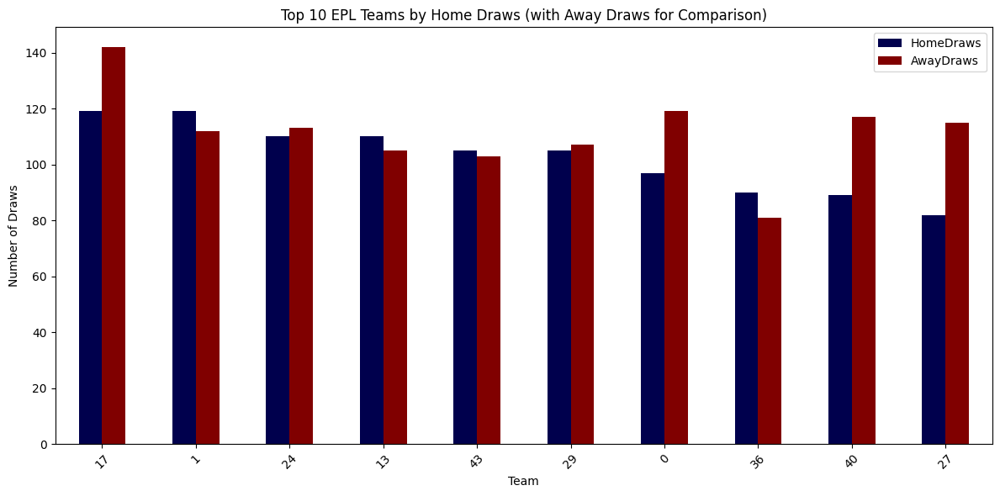

In [ ]:
top_10_by_home_draws = team_performance.sort_values("HomeDraws", ascending=False).head(10)

# Plot Away vs. Home Draws for those teams
top_10_by_home_draws[["HomeDraws", "AwayDraws"]].plot(
    kind="bar", figsize=(12, 6), colormap="seismic"
)
plt.title("Top 10 EPL Teams by Home Draws (with Away Draws for Comparison)")
plt.ylabel("Number of Draws")
plt.xlabel("Team")
plt.xticks(rotation=45)
plt.legend(["HomeDraws", "AwayDraws"])
plt.tight_layout()
plt.show()

In [ ]:
# Add result indicators
df_copy["AwayLoss"] = df_copy["FullTimeResult"] == "H"
df_copy["HomeLoss"] = df_copy["FullTimeResult"] == "A"

# Group by team
away_stats = df_copy.groupby("AwayTeam")[["AwayLoss"]].sum()
home_stats = df_copy.groupby("HomeTeam")[["HomeLoss"]].sum()

# Rename columns
away_stats.columns = ["AwayLoss"]
home_stats.columns = ["HomeLoss"]

# Combine into one DataFrame
team_performance_l = pd.concat([home_stats, away_stats], axis=1).fillna(0)

# Sort by home loos for display
team_performance_l.sort_values("HomeLoss", ascending=False).tail(25)

,HomeLoss,AwayLoss
Bournemouth,57,81
Norwich,57,85
Arsenal,57,130
Stoke,55,100
Liverpool,50,135
Leeds,47,63
Portsmouth,45,75
Charlton,45,63
Brighton,45,67
Swansea,45,73


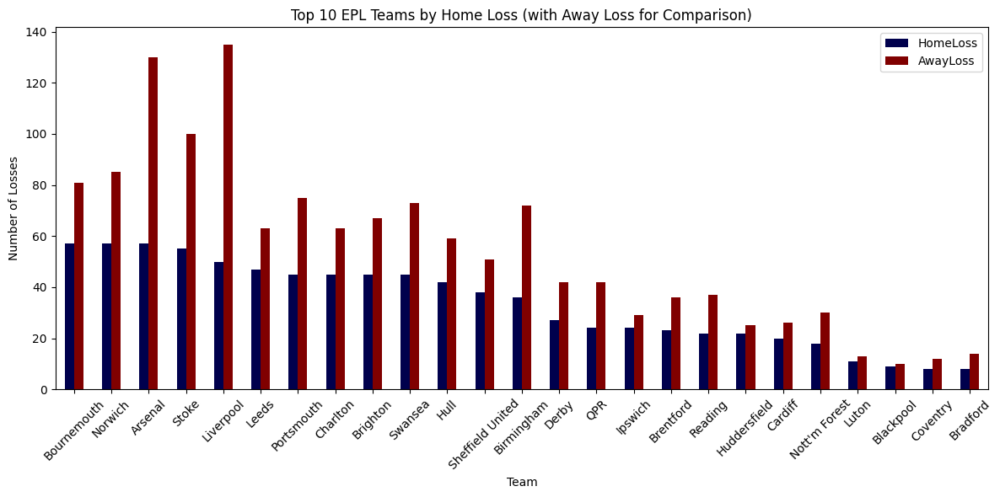

In [ ]:
# Top 10 teams by Home Loss
top_10_by_home_loss = team_performance_l.sort_values("HomeLoss", ascending=False).tail(25)

# Plot Away vs. Home Loss for those teams
top_10_by_home_loss[["HomeLoss", "AwayLoss"]].plot(
    kind="bar", figsize=(12, 6), colormap="seismic"
)
plt.title("Top 10 EPL Teams by Home Loss (with Away Loss for Comparison)")
plt.ylabel("Number of Losses")
plt.xlabel("Team")
plt.xticks(rotation=45)
plt.legend(["HomeLoss", "AwayLoss"])
plt.tight_layout()
plt.show()

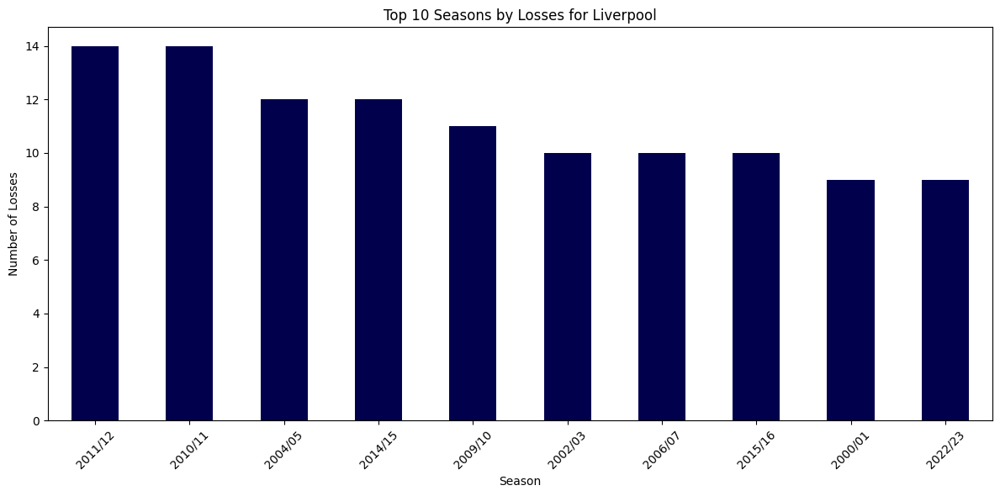

In [ ]:
team_name = "Liverpool"

df_copy["TeamLoss"] = (
    ((df_copy["HomeTeam"] == team_name) & (df_copy["FullTimeResult"] == "A"))
    | ((df_copy["AwayTeam"] == team_name) & (df_copy["FullTimeResult"] == "H"))
).astype(int)

# Group by season and count losses
team_losses_by_season = (
    df_copy.groupby("Season")["TeamLoss"].sum().sort_values(ascending=False)
)

team_losses_by_season.head(10).plot(kind="bar", figsize=(12, 6), colormap="seismic")

plt.title("Top 10 Seasons by Losses for Liverpool")
plt.ylabel("Number of Losses")
plt.xlabel("Season")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Average goals scored at home and away by each team
home_goals = (
    df_copy.groupby("HomeTeam")["FullTimeHomeGoals"].mean().rename("AvgHomeGoals")
)
away_goals = (
    df_copy.groupby("AwayTeam")["FullTimeAwayGoals"].mean().rename("AvgAwayGoals")
)

# Combine
avg_goals = pd.concat([home_goals, away_goals], axis=1).fillna(0)

# Sort by AvgHomeGoals
avg_goals_sorted = avg_goals.sort_values("AvgHomeGoals", ascending=False)
avg_goals_sorted.head(10)

,AvgHomeGoals,AvgAwayGoals
Man City,2.186667,1.633333
Arsenal,2.147436,1.648188
Liverpool,2.081370,1.645435
Chelsea,2.057569,1.572650
Man United,2.040512,1.592751
Tottenham,1.835821,1.407249
Brentford,1.653333,1.351351
Blackpool,1.578947,1.315789
Newcastle,1.565116,1.111369
Everton,1.511677,1.049251


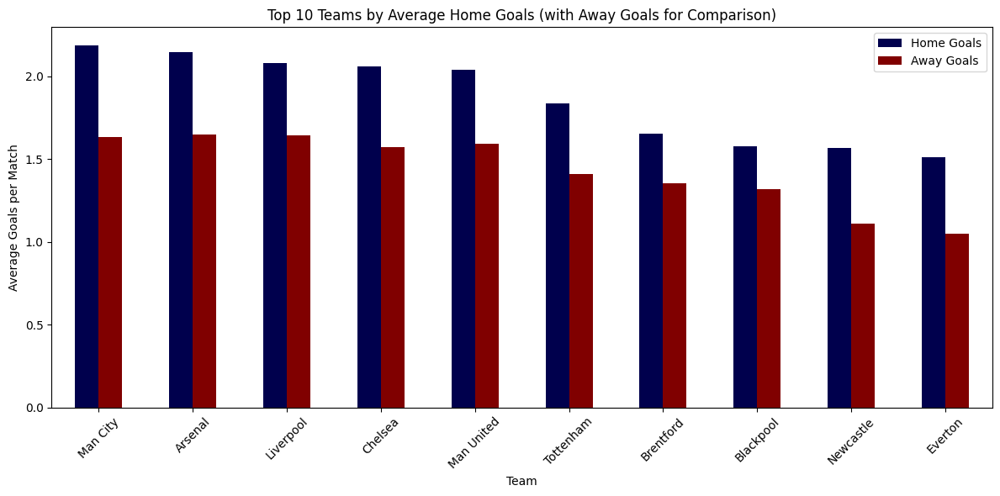

In [ ]:
# Top 10 teams by average home goals
top_10_avg_goals = avg_goals.sort_values("AvgHomeGoals", ascending=False).head(10)

# Plot
top_10_avg_goals.plot(kind="bar", figsize=(12, 6), colormap="seismic")
plt.title("Top 10 Teams by Average Home Goals (with Away Goals for Comparison)")
plt.ylabel("Average Goals per Match")
plt.xlabel("Team")
plt.xticks(rotation=45)
plt.legend(["Home Goals", "Away Goals"])
plt.tight_layout()
plt.show()

In [ ]:
# Filter only Liverpool matches (home or away)
liverpool_df = df[(df['HomeTeam'] == 'Liverpool') | (df['AwayTeam'] == 'Liverpool')].copy()

# Create a column to identify venue
liverpool_df['Venue'] = liverpool_df.apply(
    lambda row: 'Home' if row['HomeTeam'] == 'Liverpool' else 'Away',
    axis=1
)

# Function to calculate conversion rate based on venue
def calculate_conversion(df, venue):
    filtered = df[(df['Venue'] == venue) & (df['HalfTimeResult'].isin(['H', 'A']))]
    
    lead_held = (
        ((filtered['Venue'] == 'Home') & (filtered['HalfTimeResult'] == 'H') & (filtered['FullTimeResult'] == 'H')) |
        ((filtered['Venue'] == 'Away') & (filtered['HalfTimeResult'] == 'A') & (filtered['FullTimeResult'] == 'A'))
    ).sum()
    
    total_leads = len(filtered)
    
    rate = (lead_held / total_leads * 100) if total_leads > 0 else 0
    print(f"🏟️ {venue} - Halftime leads converted to full-time wins: {rate:.2f}% (Out of {total_leads} leads)")

# Run for both Home and Away
calculate_conversion(liverpool_df, 'Home')
calculate_conversion(liverpool_df, 'Away')


🏟️ Home - Halftime leads converted to full-time wins: 72.22% (Out of 288 leads)
🏟️ Away - Halftime leads converted to full-time wins: 46.83% (Out of 284 leads)


In [ ]:
# Step 1: Filter only Liverpool matches
liverpool_matches = df[(df['HomeTeam'] == 'Liverpool') | (df['AwayTeam'] == 'Liverpool')].copy()

# Step 2: Select rows where Liverpool had a halftime lead (either home or away)
liverpool_leads = liverpool_matches[
    ((liverpool_matches['HomeTeam'] == 'Liverpool') & (liverpool_matches['HalfTimeResult'] == 'H')) |
    ((liverpool_matches['AwayTeam'] == 'Liverpool') & (liverpool_matches['HalfTimeResult'] == 'A'))
].copy()

# Step 3: Did they hold the lead?
liverpool_leads["LeadHeld"] = (
    (
        (liverpool_leads["HomeTeam"] == "Liverpool") &
        (liverpool_leads["HalfTimeResult"] == "H") &
        (liverpool_leads["FullTimeResult"] == "H")
    ) |
    (
        (liverpool_leads["AwayTeam"] == "Liverpool") &
        (liverpool_leads["HalfTimeResult"] == "A") &
        (liverpool_leads["FullTimeResult"] == "A")
    )
).astype(int)

# Step 4: Tag venue for clarity
liverpool_leads["Venue"] = liverpool_leads.apply(
    lambda row: "Home" if row["HomeTeam"] == "Liverpool" else "Away", axis=1
)

# Step 5: Summary by venue
conversion_summary = liverpool_leads.groupby("Venue")["LeadHeld"].agg(["sum", "count"])
conversion_summary["ConversionRate"] = (conversion_summary["sum"] / conversion_summary["count"]) * 100

# Step 6: Print
print("📊 Liverpool's Halftime Lead Conversion Summary:")
print(conversion_summary)


📊 Liverpool's Halftime Lead Conversion Summary:
       sum  count  ConversionRate
Venue                            
Away   133    161       82.608696
Home   208    229       90.829694


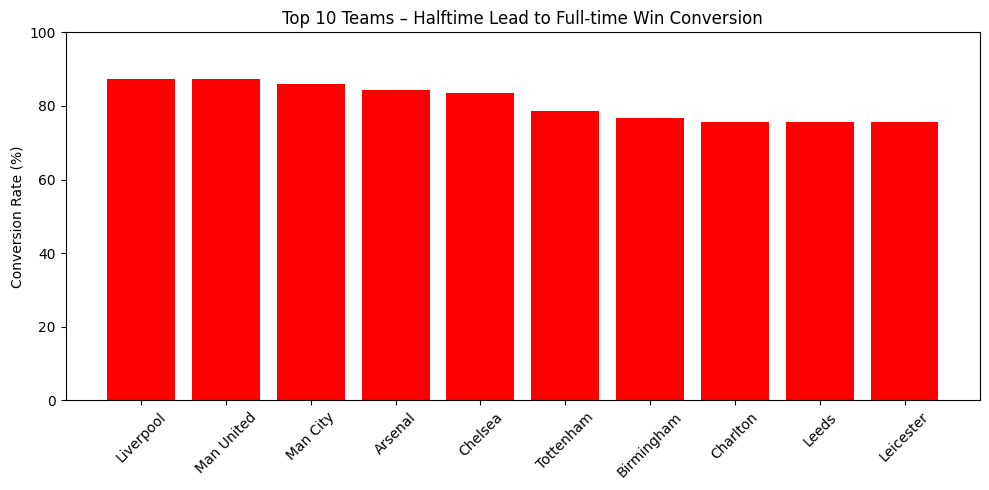

In [ ]:
# Calculate halftime lead conversions for all teams
team_analysis = df[
    df["HalfTimeResult"].isin(["H", "A"])  # Only matches with a clear HT leader
].copy()

# Determine if lead was held
team_analysis["LeadHeld"] = (
    (
        (team_analysis["HalfTimeResult"] == "H") & (team_analysis["FullTimeResult"] == "H")
    ) |
    (
        (team_analysis["HalfTimeResult"] == "A") & (team_analysis["FullTimeResult"] == "A")
    )
).astype(int)

# Identify leading team (home if H, away if A)
team_analysis["LeadingTeam"] = team_analysis.apply(
    lambda row: row["HomeTeam"] if row["HalfTimeResult"] == "H" else row["AwayTeam"], axis=1
)

# Group by leading team and calculate conversion rate
team_conversion = team_analysis.groupby("LeadingTeam")["LeadHeld"].agg(["sum", "count"])
team_conversion["ConversionRate"] = (team_conversion["sum"] / team_conversion["count"]) * 100
# Top 10 teams by conversion rate
top_10 = team_conversion.sort_values("ConversionRate", ascending=False).head(10)

# Plot
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.bar(top_10.index, top_10["ConversionRate"], color='red')
plt.title("Top 10 Teams – Halftime Lead to Full-time Win Conversion")
plt.ylabel("Conversion Rate (%)")
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.tight_layout()
plt.show()



In [ ]:
# Filter matches where Liverpool was either Home or Away AND there was a halftime lead
liverpool_remontada = df[
    ((df["HomeTeam"] == "Liverpool") | (df["AwayTeam"] == "Liverpool")) &
    (df["HalfTimeResult"].isin(["H", "A"]))
].copy()

# Create a column for whether Liverpool came back from behind and won
liverpool_remontada["ComebackWin"] = (
    (
        (liverpool_remontada["HomeTeam"] == "Liverpool") &
        (liverpool_remontada["HalfTimeResult"] == "A") &
        (liverpool_remontada["FullTimeResult"] == "H")
    ) |
    (
        (liverpool_remontada["AwayTeam"] == "Liverpool") &
        (liverpool_remontada["HalfTimeResult"] == "H") &
        (liverpool_remontada["FullTimeResult"] == "A")
    )
).astype(int)

# Calculate probability of a comeback win (remontada)
remontada_rate = (liverpool_remontada["ComebackWin"].sum() / len(liverpool_remontada)) * 100
print(f"🔁 Liverpool's Remontada Rate (comeback wins from behind at halftime): {remontada_rate:.2f}%")


🔁 Liverpool's Remontada Rate (comeback wins from behind at halftime): 4.37%


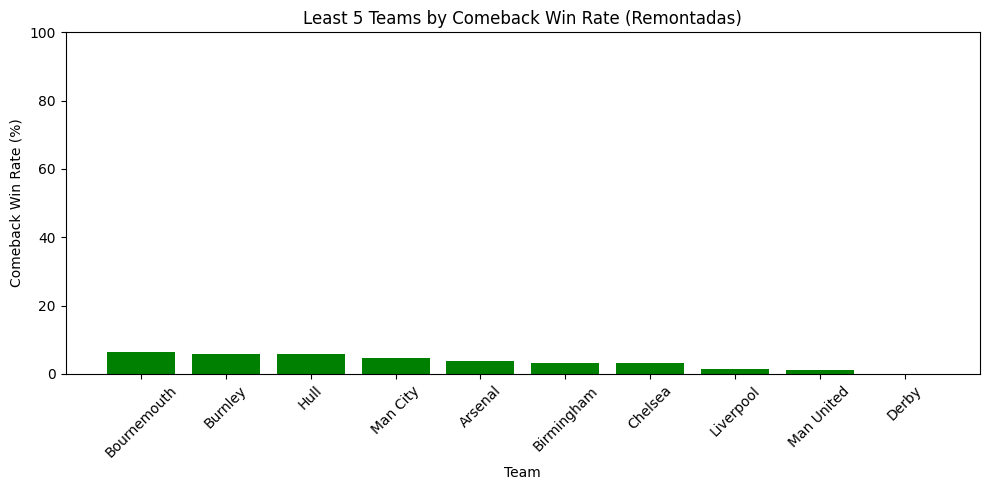

In [ ]:
# Ensure 'ComebackWin' is created properly on team_analysis
team_analysis["ComebackWin"] = (
    (
        (team_analysis["HalfTimeResult"] == "A") & (team_analysis["FullTimeResult"] == "H")
    ) |
    (
        (team_analysis["HalfTimeResult"] == "H") & (team_analysis["FullTimeResult"] == "A")
    )
).astype(int)

# Group by team and compute remontada stats correctly
remontada_stats = team_analysis.groupby("LeadingTeam").agg(
    ComebackWins=('ComebackWin', 'sum'),
    TotalOpportunities=('ComebackWin', 'count')
).reset_index()

# Calculate comeback rate
remontada_stats["RemontadaRate"] = (remontada_stats["ComebackWins"] / remontada_stats["TotalOpportunities"]) * 100

# Sort and pick top 5
top_remontadas = remontada_stats.sort_values("RemontadaRate", ascending=False).tail(10)

# ✅ Plot Top 5 Teams by Comeback Rate
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.bar(top_remontadas["LeadingTeam"], top_remontadas["RemontadaRate"], color='green')
plt.title("Least 5 Teams by Comeback Win Rate (Remontadas)")
plt.ylabel("Comeback Win Rate (%)")
plt.xlabel("Team")
plt.ylim(0, 100)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


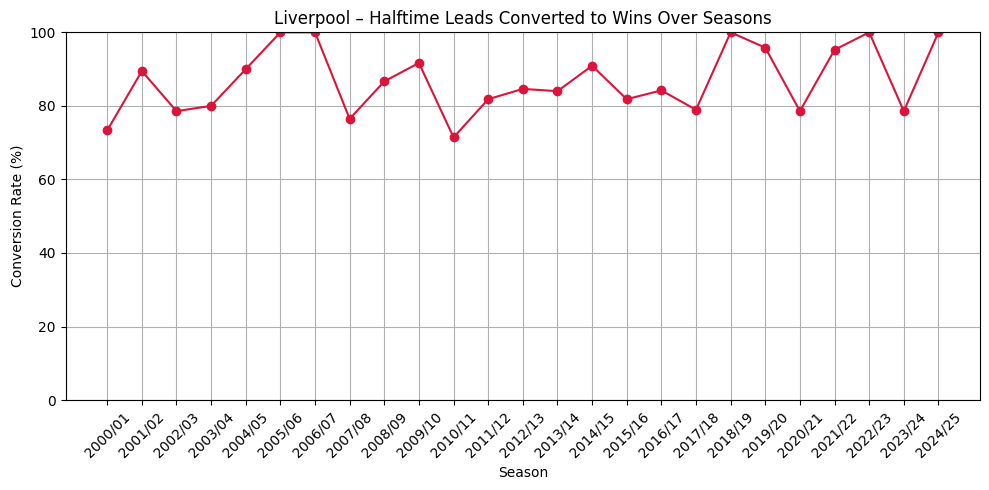

In [ ]:
# Filter Liverpool matches where they were leading at halftime (home or away)
liverpool_leads = team_analysis[
    (
        ((team_analysis["HalfTimeResult"] == "H") & (team_analysis["HomeTeam"] == "Liverpool")) |
        ((team_analysis["HalfTimeResult"] == "A") & (team_analysis["AwayTeam"] == "Liverpool"))
    )
]

# Group by Season to compute sum and total
liverpool_season_conversion = liverpool_leads.groupby("Season")["LeadHeld"].agg(["sum", "count"])
liverpool_season_conversion["ConversionRate"] = (
    liverpool_season_conversion["sum"] / liverpool_season_conversion["count"]
) * 100

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(
    liverpool_season_conversion.index,
    liverpool_season_conversion["ConversionRate"],
    marker="o",
    color="crimson"
)

plt.title("Liverpool – Halftime Leads Converted to Wins Over Seasons")
plt.ylabel("Conversion Rate (%)")
plt.xlabel("Season")
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.grid(True)
plt.tight_layout()
plt.show()


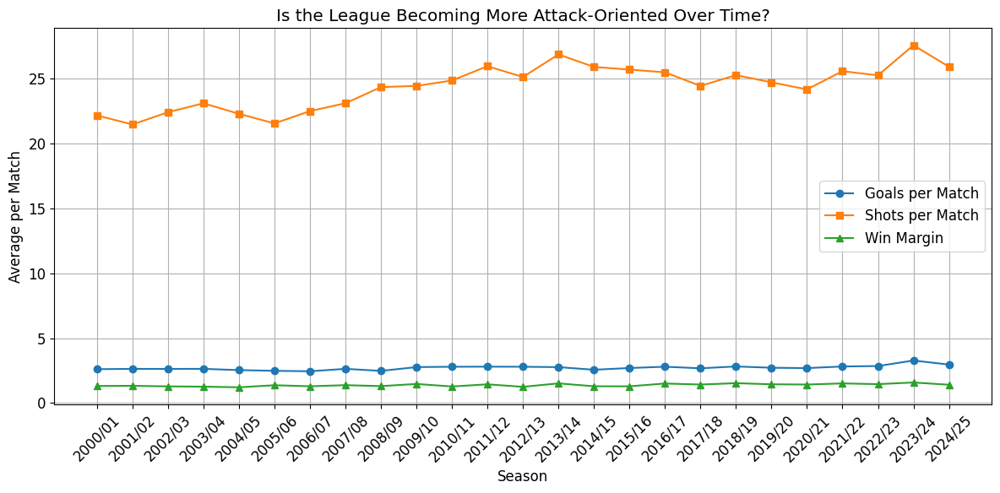

In [ ]:
# 3. Is the League Becoming More Attack-Oriented Over Time?
df_copy = df.copy() 

# Calculate match-level features
df_copy["TotalGoals"] = df_copy["FullTimeHomeGoals"] + df_copy["FullTimeAwayGoals"]
df_copy["TotalShots"] = df_copy["HomeShots"] + df_copy["AwayShots"]
df_copy["WinMargin"] = abs(df_copy["FullTimeHomeGoals"] - df_copy["FullTimeAwayGoals"])

# Step 2: Group by Season and calculate average
attack_trend = df_copy.groupby("Season")[
    ["TotalGoals", "TotalShots", "WinMargin"]
].mean()
attack_trend = attack_trend.sort_index()

plt.figure(figsize=(12, 6))

# Goals trend
plt.plot(
    attack_trend.index, attack_trend["TotalGoals"], marker="o", label="Goals per Match"
)

# Shots trend
plt.plot(
    attack_trend.index, attack_trend["TotalShots"], marker="s", label="Shots per Match"
)

# Win Margin trend
plt.plot(attack_trend.index, attack_trend["WinMargin"], marker="^", label="Win Margin")

plt.title("Is the League Becoming More Attack-Oriented Over Time?")
plt.xlabel("Season")
plt.ylabel("Average per Match")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

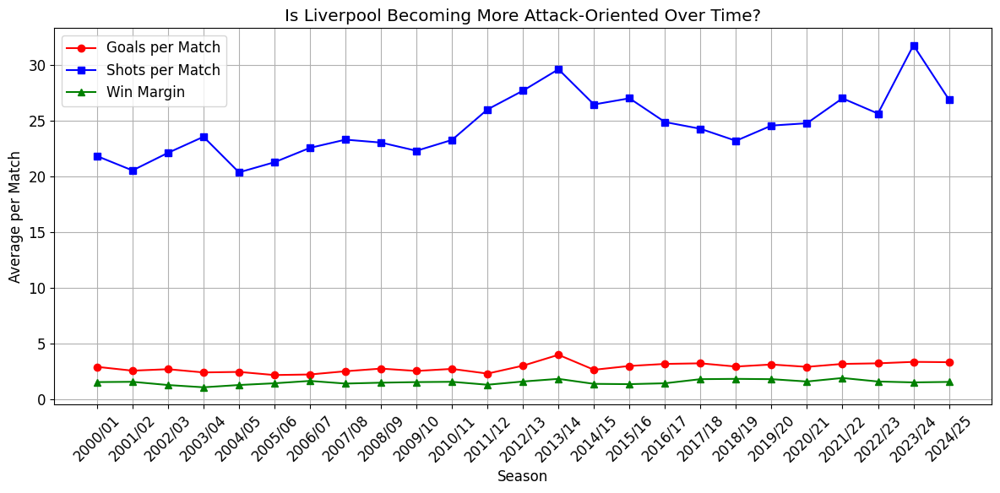

In [ ]:
import matplotlib.pyplot as plt

# Step 1: Filter only Liverpool games (home or away)
liverpool_only = df[
    (df["HomeTeam"] == "Liverpool") | (df["AwayTeam"] == "Liverpool")
].copy()

# Step 2: Calculate match-level metrics
liverpool_only["TotalGoals"] = liverpool_only["FullTimeHomeGoals"] + liverpool_only["FullTimeAwayGoals"]
liverpool_only["TotalShots"] = liverpool_only["HomeShots"] + liverpool_only["AwayShots"]
liverpool_only["WinMargin"] = abs(liverpool_only["FullTimeHomeGoals"] - liverpool_only["FullTimeAwayGoals"])

# Step 3: Group by season and calculate mean trends
liverpool_trend = liverpool_only.groupby("Season")[["TotalGoals", "TotalShots", "WinMargin"]].mean()
liverpool_trend = liverpool_trend.sort_index()

# Step 4: Plot
plt.figure(figsize=(12, 6))
plt.plot(liverpool_trend.index, liverpool_trend["TotalGoals"], marker="o", label="Goals per Match", color="red")
plt.plot(liverpool_trend.index, liverpool_trend["TotalShots"], marker="s", label="Shots per Match", color="blue")
plt.plot(liverpool_trend.index, liverpool_trend["WinMargin"], marker="^", label="Win Margin", color="green")

plt.title("Is Liverpool Becoming More Attack-Oriented Over Time?")
plt.xlabel("Season")
plt.ylabel("Average per Match")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


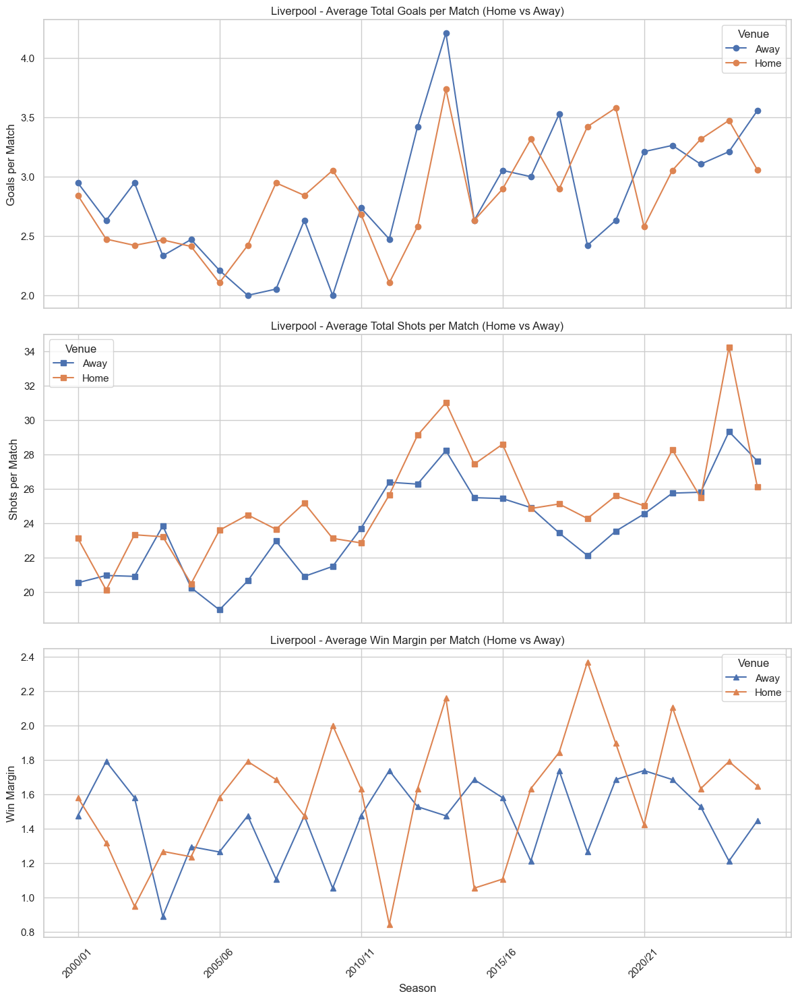

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your dataset (update filename if needed)
df = pd.read_csv("epl_final.csv")

# Step 1: Filter only Liverpool games (home or away)
liverpool_only = df[
    (df["HomeTeam"] == "Liverpool") | (df["AwayTeam"] == "Liverpool")
].copy()

# Step 2: Add 'Venue' column
liverpool_only["Venue"] = liverpool_only["HomeTeam"].apply(lambda x: "Home" if x == "Liverpool" else "Away")

# Step 3: Calculate match-level metrics
liverpool_only["TotalGoals"] = liverpool_only["FullTimeHomeGoals"] + liverpool_only["FullTimeAwayGoals"]
liverpool_only["TotalShots"] = liverpool_only["HomeShots"] + liverpool_only["AwayShots"]
liverpool_only["WinMargin"] = abs(liverpool_only["FullTimeHomeGoals"] - liverpool_only["FullTimeAwayGoals"])

# Step 4: Group by Season and Venue
grouped = liverpool_only.groupby(["Season", "Venue"])[["TotalGoals", "TotalShots", "WinMargin"]].mean().reset_index()

# Step 5: Pivot to prepare for plotting
pivot_goals = grouped.pivot(index="Season", columns="Venue", values="TotalGoals")
pivot_shots = grouped.pivot(index="Season", columns="Venue", values="TotalShots")
pivot_margin = grouped.pivot(index="Season", columns="Venue", values="WinMargin")

# Step 6: Plotting
fig, ax = plt.subplots(3, 1, figsize=(12, 15), sharex=True)

# Total Goals
pivot_goals.plot(ax=ax[0], marker='o')
ax[0].set_title("Liverpool - Average Total Goals per Match (Home vs Away)")
ax[0].set_ylabel("Goals per Match")
ax[0].grid(True)

# Total Shots
pivot_shots.plot(ax=ax[1], marker='s')
ax[1].set_title("Liverpool - Average Total Shots per Match (Home vs Away)")
ax[1].set_ylabel("Shots per Match")
ax[1].grid(True)

# Win Margin
pivot_margin.plot(ax=ax[2], marker='^')
ax[2].set_title("Liverpool - Average Win Margin per Match (Home vs Away)")
ax[2].set_ylabel("Win Margin")
ax[2].set_xlabel("Season")
ax[2].grid(True)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



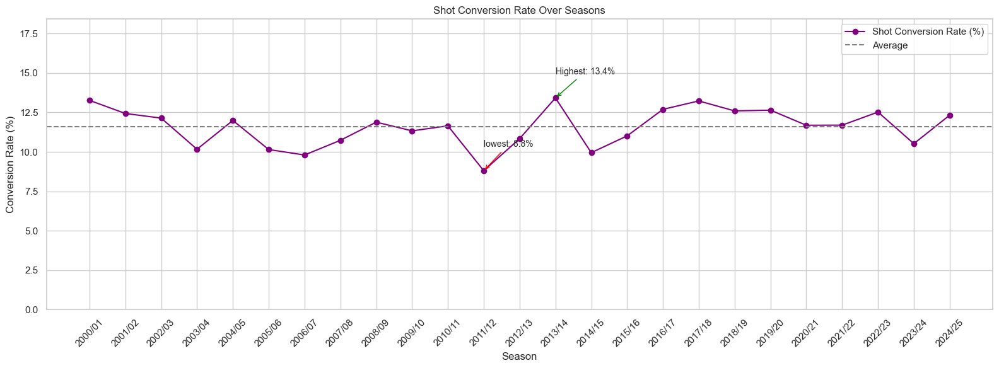

In [ ]:
# Calculate shot conversion rate (%)
attack_trend["ShotConversion"] = (
    attack_trend["TotalGoals"] / attack_trend["TotalShots"]
) * 100

plt.figure(figsize=(16, 6))
plt.plot(
    attack_trend.index,
    attack_trend["ShotConversion"],
    marker="o",
    color="purple",
    label="Shot Conversion Rate (%)",
)

plt.axhline(
    attack_trend["ShotConversion"].mean(), color="gray", linestyle="--", label="Average"
)

max_season = attack_trend["ShotConversion"].idxmax()
max_val = attack_trend["ShotConversion"].max()

min_season = attack_trend["ShotConversion"].idxmin()
min_val = attack_trend["ShotConversion"].min()

plt.annotate(
    f"Highest: {max_val:.1f}%",
    xy=(max_season, max_val),
    xytext=(max_season, max_val + 1.5),
    arrowprops=dict(arrowstyle="->", color="green"),
    fontsize=10,
)

plt.annotate(
    f"lowest: {min_val:.1f}%",
    xy=(min_season, min_val),
    xytext=(min_season, min_val + 1.5),
    arrowprops=dict(arrowstyle="->", color="red"),
    fontsize=10,
)

# Final plot settings
plt.title("Shot Conversion Rate Over Seasons")
plt.ylabel("Conversion Rate (%)")
plt.xlabel("Season")
plt.xticks(rotation=45)
plt.ylim(0, attack_trend["ShotConversion"].max() + 5)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


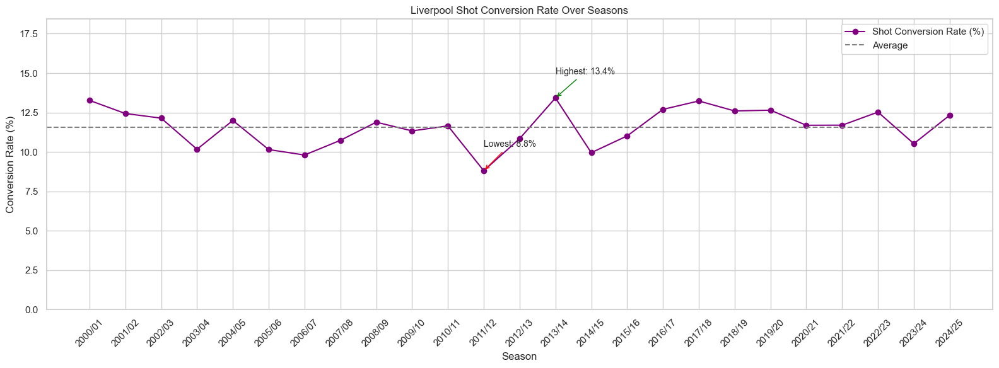

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your data (update file name if needed)
df = pd.read_csv("epl_final.csv")

# Step 1: Filter only Liverpool matches
liverpool_df = df[(df["HomeTeam"] == "Liverpool") | (df["AwayTeam"] == "Liverpool")].copy()

# Step 2: Calculate total goals and shots per match
liverpool_df["TotalGoals"] = liverpool_df["FullTimeHomeGoals"] + liverpool_df["FullTimeAwayGoals"]
liverpool_df["TotalShots"] = liverpool_df["HomeShots"] + liverpool_df["AwayShots"]

# Step 3: Group by Season and calculate averages
attack_trend = liverpool_df.groupby("Season")[["TotalGoals", "TotalShots"]].mean()

# Step 4: Calculate shot conversion rate (%)
attack_trend["ShotConversion"] = (attack_trend["TotalGoals"] / attack_trend["TotalShots"]) * 100

# Step 5: Plot
plt.figure(figsize=(16, 6))
plt.plot(
    attack_trend.index,
    attack_trend["ShotConversion"],
    marker="o",
    color="purple",
    label="Shot Conversion Rate (%)",
)

# Add average line
plt.axhline(
    attack_trend["ShotConversion"].mean(), color="gray", linestyle="--", label="Average"
)

# Highlight best and worst seasons
max_season = attack_trend["ShotConversion"].idxmax()
max_val = attack_trend["ShotConversion"].max()

min_season = attack_trend["ShotConversion"].idxmin()
min_val = attack_trend["ShotConversion"].min()

plt.annotate(
    f"Highest: {max_val:.1f}%",
    xy=(max_season, max_val),
    xytext=(max_season, max_val + 1.5),
    arrowprops=dict(arrowstyle="->", color="green"),
    fontsize=10,
)

plt.annotate(
    f"Lowest: {min_val:.1f}%",
    xy=(min_season, min_val),
    xytext=(min_season, min_val + 1.5),
    arrowprops=dict(arrowstyle="->", color="red"),
    fontsize=10,
)

# Final plot settings
plt.title("Liverpool Shot Conversion Rate Over Seasons")
plt.ylabel("Conversion Rate (%)")
plt.xlabel("Season")
plt.xticks(rotation=45)
plt.ylim(0, attack_trend["ShotConversion"].max() + 5)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


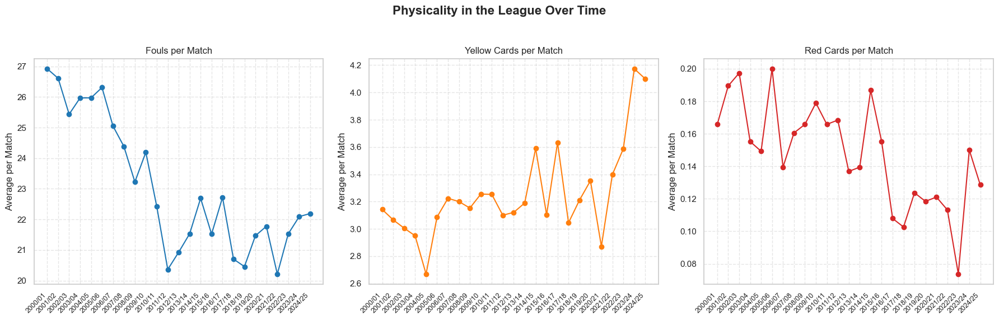

In [ ]:
# 4. Are matches becoming more physical, as measured by fouls and cards?
df_copy = df.copy()

df_copy["TotalFouls"] = df_copy["HomeFouls"] + df_copy["AwayFouls"]
df_copy["TotalYellowCards"] = df_copy["HomeYellowCards"] + df_copy["AwayYellowCards"]
df_copy["TotalRedCards"] = df_copy["HomeRedCards"] + df_copy["AwayRedCards"]

physical_trends = df_copy.groupby("Season")[
    ["TotalFouls", "TotalYellowCards", "TotalRedCards"]
].mean()

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True)

metrics = ["TotalFouls", "TotalYellowCards", "TotalRedCards"]
colors = ["#1f77b4", "#ff7f0e", "#d62728"]
titles = ["Fouls per Match", "Yellow Cards per Match", "Red Cards per Match"]

for i, ax in enumerate(axes):
    ax.plot(
        physical_trends.index, physical_trends[metrics[i]], marker="o", color=colors[i]
    )
    ax.set_title(titles[i], fontsize=12)
    ax.set_ylabel("Average per Match")
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.set_xticks(range(len(physical_trends.index)))
    ax.set_xticklabels(physical_trends.index, rotation=45, ha="right", fontsize=9)

fig.suptitle("Physicality in the League Over Time", fontsize=16, fontweight="bold")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

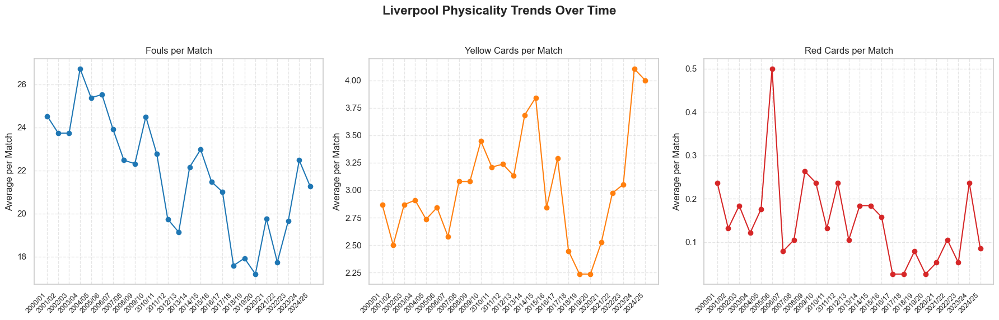

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your dataset
df = pd.read_csv("epl_final.csv")

# Step 1: Filter Liverpool matches
liverpool_df = df[(df["HomeTeam"] == "Liverpool") | (df["AwayTeam"] == "Liverpool")].copy()

# Step 2: Create physicality-related columns
liverpool_df["TotalFouls"] = liverpool_df["HomeFouls"] + liverpool_df["AwayFouls"]
liverpool_df["TotalYellowCards"] = liverpool_df["HomeYellowCards"] + liverpool_df["AwayYellowCards"]
liverpool_df["TotalRedCards"] = liverpool_df["HomeRedCards"] + liverpool_df["AwayRedCards"]

# Step 3: Group by season and calculate average per match
physical_trends = liverpool_df.groupby("Season")[["TotalFouls", "TotalYellowCards", "TotalRedCards"]].mean()

# Step 4: Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True)

metrics = ["TotalFouls", "TotalYellowCards", "TotalRedCards"]
colors = ["#1f77b4", "#ff7f0e", "#d62728"]
titles = ["Fouls per Match", "Yellow Cards per Match", "Red Cards per Match"]

for i, ax in enumerate(axes):
    ax.plot(
        physical_trends.index, physical_trends[metrics[i]], marker="o", color=colors[i]
    )
    ax.set_title(titles[i], fontsize=12)
    ax.set_ylabel("Average per Match")
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.set_xticks(range(len(physical_trends.index)))
    ax.set_xticklabels(physical_trends.index, rotation=45, ha="right", fontsize=9)

fig.suptitle("Liverpool Physicality Trends Over Time", fontsize=16, fontweight="bold")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


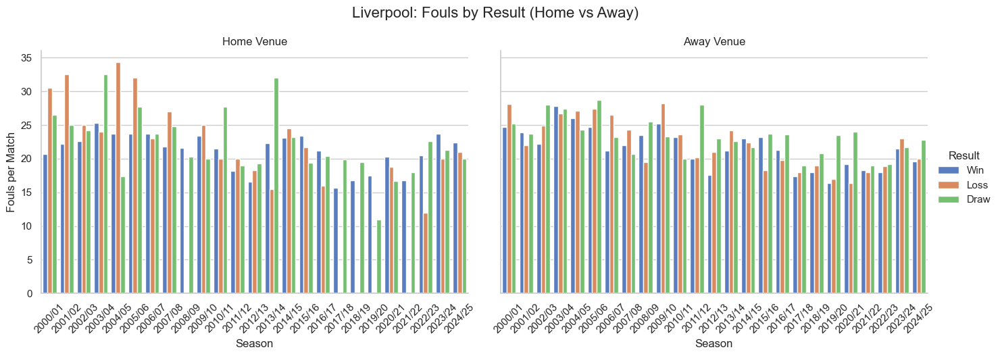

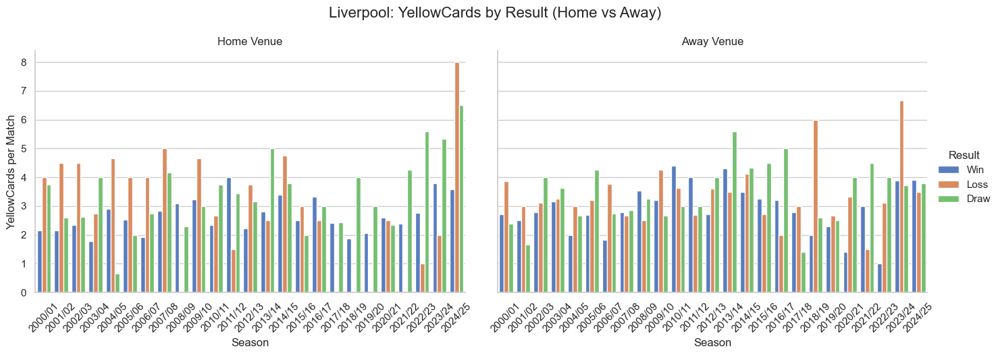

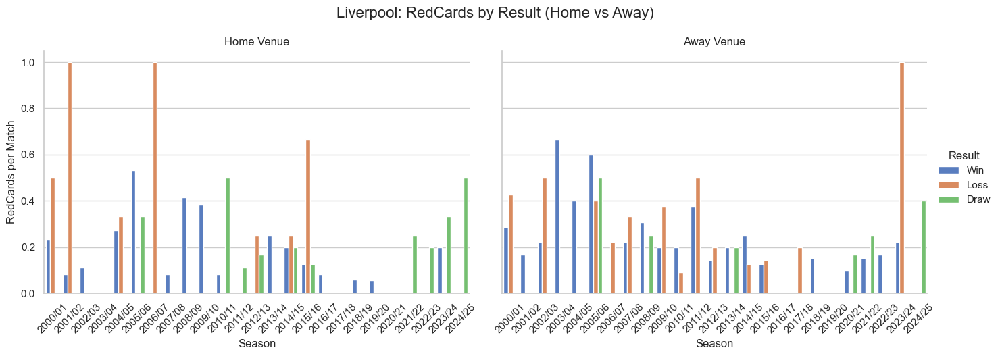

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Load data
df = pd.read_csv("epl_final.csv")

# Filter Liverpool games
liverpool_df = df[(df["HomeTeam"] == "Liverpool") | (df["AwayTeam"] == "Liverpool")].copy()

# Define Venue
liverpool_df["Venue"] = liverpool_df["HomeTeam"].apply(lambda x: "Home" if x == "Liverpool" else "Away")

# Goals For/Against and Match Result
liverpool_df["GoalsFor"] = liverpool_df.apply(
    lambda row: row["FullTimeHomeGoals"] if row["Venue"] == "Home" else row["FullTimeAwayGoals"], axis=1)
liverpool_df["GoalsAgainst"] = liverpool_df.apply(
    lambda row: row["FullTimeAwayGoals"] if row["Venue"] == "Home" else row["FullTimeHomeGoals"], axis=1)
liverpool_df["Result"] = liverpool_df.apply(
    lambda row: "Win" if row["GoalsFor"] > row["GoalsAgainst"] else
    ("Loss" if row["GoalsFor"] < row["GoalsAgainst"] else "Draw"), axis=1
)

# Physical stats
liverpool_df["Fouls"] = liverpool_df["HomeFouls"] + liverpool_df["AwayFouls"]
liverpool_df["YellowCards"] = liverpool_df["HomeYellowCards"] + liverpool_df["AwayYellowCards"]
liverpool_df["RedCards"] = liverpool_df["HomeRedCards"] + liverpool_df["AwayRedCards"]

# Melt for comparison
melt_df = liverpool_df.melt(
    id_vars=["Season", "Venue", "Result"],
    value_vars=["Fouls", "YellowCards", "RedCards"],
    var_name="Metric",
    value_name="Value"
)

# === Individual detailed plot for each metric ===
for metric in ["Fouls", "YellowCards", "RedCards"]:
    g = sns.catplot(
        data=melt_df[melt_df["Metric"] == metric],
        x="Season", y="Value", hue="Result", col="Venue",
        kind="bar", height=5, aspect=1.4, palette="muted", errorbar=None
    )
    g.set_titles("{col_name} Venue")
    g.set_axis_labels("Season", f"{metric} per Match")
    g.set_xticklabels(rotation=45)
    g.fig.subplots_adjust(top=0.85)
    g.fig.suptitle(f"Liverpool: {metric} by Result (Home vs Away)", fontsize=16)
    plt.show()
    


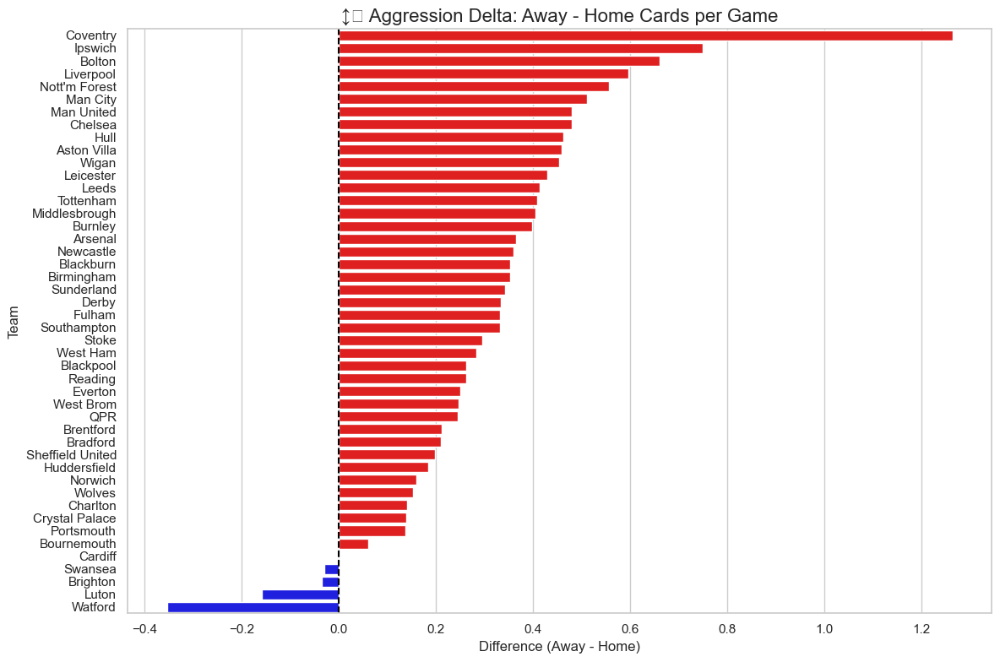

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data (replace with your actual DataFrame if already loaded)
df_copy = pd.read_csv("epl_final.csv")

# Home discipline
home_cards = df_copy.groupby("HomeTeam").agg(
    HomeYellows=("HomeYellowCards", "sum"),
    HomeReds=("HomeRedCards", "sum"),
    HomeFouls=("HomeFouls", "sum"),
    HomeGames=("HomeTeam", "count")
)

# Away discipline
away_cards = df_copy.groupby("AwayTeam").agg(
    AwayYellows=("AwayYellowCards", "sum"),
    AwayReds=("AwayRedCards", "sum"),
    AwayFouls=("AwayFouls", "sum"),
    AwayGames=("AwayTeam", "count")
)

# Combine home and away stats
discipline = home_cards.join(away_cards, how="inner")
discipline.index.name = "Team"

# Total cards
discipline["Cards_Home"] = discipline["HomeYellows"] + discipline["HomeReds"]
discipline["Cards_Away"] = discipline["AwayYellows"] + discipline["AwayReds"]

# Per game card rate
discipline["CardsPerGame_Home"] = discipline["Cards_Home"] / discipline["HomeGames"]
discipline["CardsPerGame_Away"] = discipline["Cards_Away"] / discipline["AwayGames"]

# Aggression delta
discipline["AggressionDelta"] = discipline["CardsPerGame_Away"] - discipline["CardsPerGame_Home"]

# Sort
delta_sorted = discipline.sort_values("AggressionDelta", ascending=False)

# Plot
plt.figure(figsize=(12, 8))
sns.set(style="whitegrid")
colors = ["red" if x > 0 else "blue" for x in delta_sorted["AggressionDelta"]]

sns.barplot(
    x=delta_sorted["AggressionDelta"],
    y=delta_sorted.index,
    palette=colors
)

plt.axvline(0, color="black", linestyle="--")
plt.title("↕️ Aggression Delta: Away - Home Cards per Game", fontsize=16)
plt.xlabel("Difference (Away - Home)")
plt.ylabel("Team")
plt.tight_layout()
plt.show()


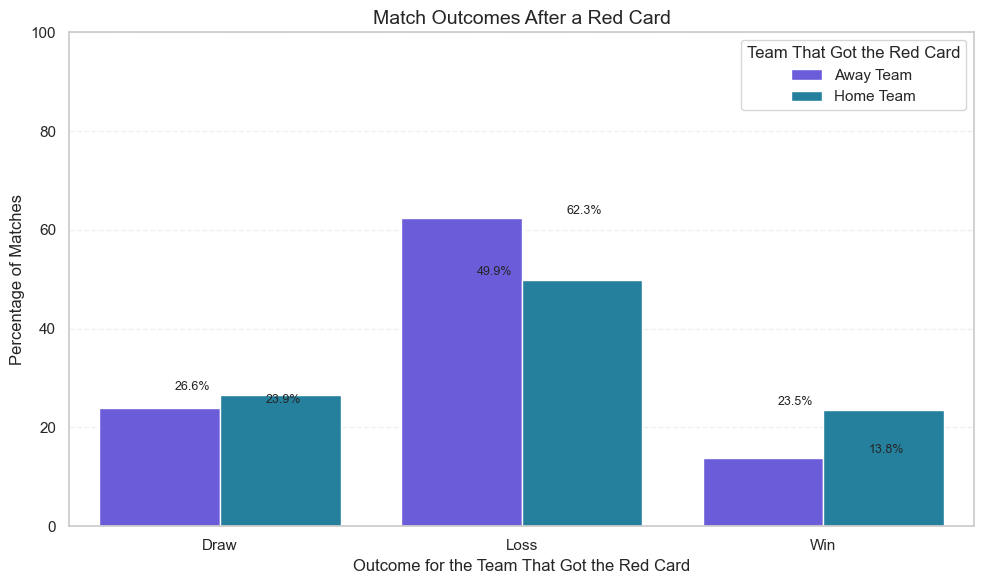

In [ ]:
df_reds = df.copy()

# Flags
df_reds["HomeRed"] = df_reds["HomeRedCards"] > 0
df_reds["AwayRed"] = df_reds["AwayRedCards"] > 0

# Who got the red card
df_reds["RedCardTeam"] = df_reds.apply(
    lambda row: (
        "Home Team" if row["HomeRed"] else "Away Team" if row["AwayRed"] else "No Red"
    ),
    axis=1,
)


# Final outcome for the red card team
def red_card_outcome(row):
    if row["RedCardTeam"] == "Home Team":
        if row["FullTimeResult"] == "H":
            return "Win"
        elif row["FullTimeResult"] == "D":
            return "Draw"
        else:
            return "Loss"
    elif row["RedCardTeam"] == "Away Team":
        if row["FullTimeResult"] == "A":
            return "Win"
        elif row["FullTimeResult"] == "D":
            return "Draw"
        else:
            return "Loss"
    else:
        return None


df_reds["RedCardOutcome"] = df_reds.apply(red_card_outcome, axis=1)

# Filter only matches with red cards
df_with_red = df_reds[df_reds["RedCardTeam"] != "No Red"]
 #Add percent for each red card team category
summary = (
    df_with_red.groupby(["RedCardTeam", "RedCardOutcome"])
    .size()
    .reset_index(name="MatchCount")
)

summary["Percentage"] = (
    summary["MatchCount"]
    / summary.groupby("RedCardTeam")["MatchCount"].transform("sum")
    * 100
)

plt.figure(figsize=(10, 6))
sns.barplot(
    data=summary,
    x="RedCardOutcome",
    y="Percentage",
    hue="RedCardTeam",
    palette=["#5B47EF", "#118AB2"],
)

plt.title("Match Outcomes After a Red Card", fontsize=14)
plt.ylabel("Percentage of Matches")
plt.xlabel("Outcome for the Team That Got the Red Card")
plt.ylim(0, 100)
plt.legend(title="Team That Got the Red Card")
plt.grid(axis="y", linestyle="--", alpha=0.3)

# Annotate bars
for i in range(len(summary)):
    row = summary.iloc[i]
    plt.text(
        x=i % 3 - 0.15 + (0.3 if row["RedCardTeam"] == "Away Team" else 0),
        y=row["Percentage"] + 1,
        s=f"{row['Percentage']:.1f}%",
        fontsize=9,
    )

plt.tight_layout()
plt.show()

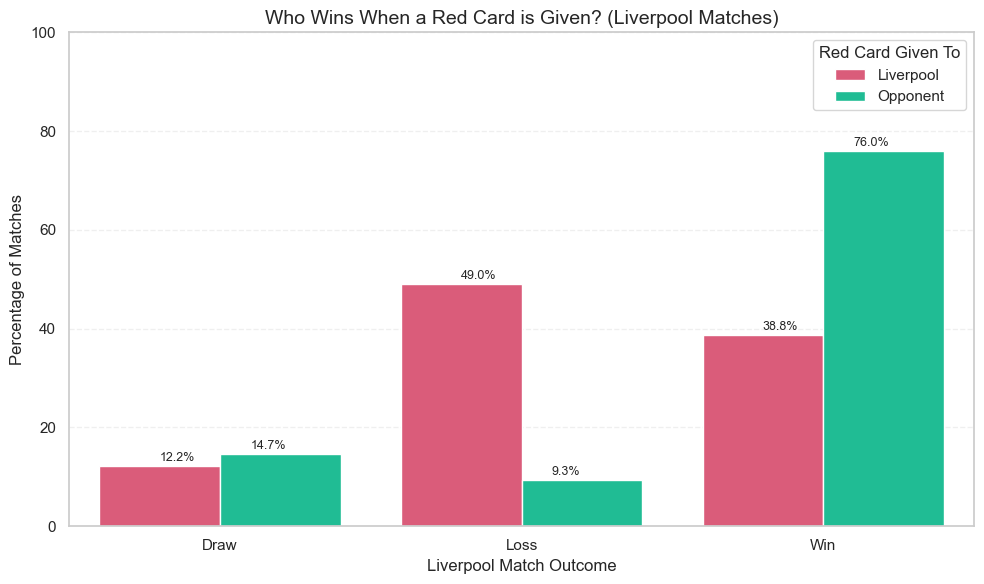

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv("epl_final.csv")

# Filter Liverpool matches
df = df[(df["HomeTeam"] == "Liverpool") | (df["AwayTeam"] == "Liverpool")].copy()

# Flag red cards
df["HomeRed"] = df["HomeRedCards"] > 0
df["AwayRed"] = df["AwayRedCards"] > 0

# Who got the red card
df["RedCardTo"] = df.apply(
    lambda row: (
        "Liverpool" if (row["HomeTeam"] == "Liverpool" and row["HomeRed"]) or 
                      (row["AwayTeam"] == "Liverpool" and row["AwayRed"])
        else "Opponent" if row["HomeRed"] or row["AwayRed"] else "No Red"
    ),
    axis=1,
)

# Determine if Liverpool won
def lfc_result(row):
    if row["HomeTeam"] == "Liverpool":
        return "Win" if row["FullTimeResult"] == "H" else "Loss" if row["FullTimeResult"] == "A" else "Draw"
    else:
        return "Win" if row["FullTimeResult"] == "A" else "Loss" if row["FullTimeResult"] == "H" else "Draw"

df["LiverpoolResult"] = df.apply(lfc_result, axis=1)

# Only games with red cards
df_red_only = df[df["RedCardTo"] != "No Red"]

# Aggregate
summary = df_red_only.groupby(["RedCardTo", "LiverpoolResult"]).size().reset_index(name="MatchCount")

# Percentage
summary["Percentage"] = (
    summary["MatchCount"] /
    summary.groupby("RedCardTo")["MatchCount"].transform("sum")
) * 100

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=summary, x="LiverpoolResult", y="Percentage", hue="RedCardTo", palette=["#EF476F", "#06D6A0"])
plt.title("Who Wins When a Red Card is Given? (Liverpool Matches)", fontsize=14)
plt.ylabel("Percentage of Matches")
plt.xlabel("Liverpool Match Outcome")
plt.ylim(0, 100)
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="Red Card Given To")

# Annotate
for i in range(len(summary)):
    row = summary.iloc[i]
    x = i % 3 + (-0.2 if row["RedCardTo"] == "Liverpool" else 0.1)
    plt.text(x, row["Percentage"] + 1, f"{row['Percentage']:.1f}%", fontsize=9)

plt.tight_layout()
plt.show()


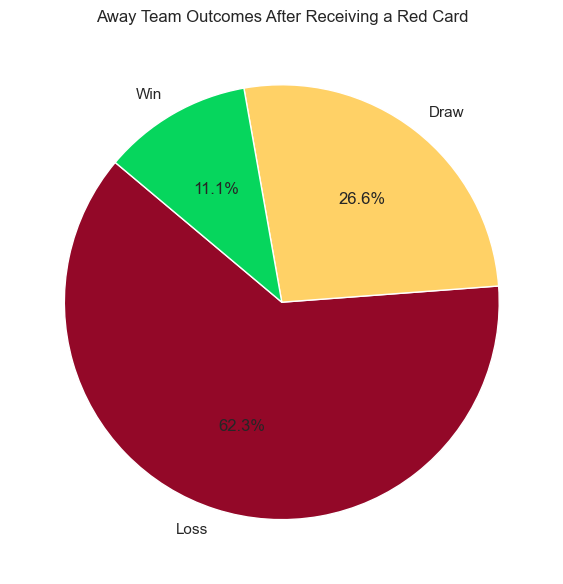

In [ ]:

# Values for away red card outcome
labels = ["Loss", "Draw", "Win"]
sizes = [62.3, 26.6, 11.1]
colors = ["#930828", "#FFD166", "#06D65D"]

plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, autopct="%1.1f%%", colors=colors, startangle=140)
plt.title("Away Team Outcomes After Receiving a Red Card")
plt.tight_layout()
plt.show()

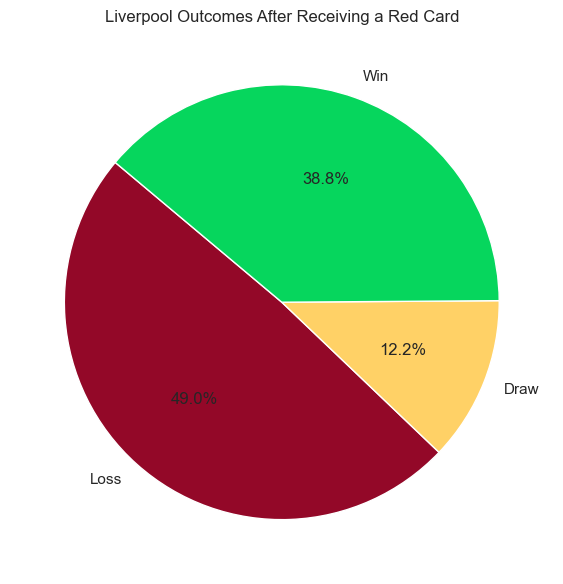

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("epl_final.csv")

# Filter only Liverpool matches
df = df[(df["HomeTeam"] == "Liverpool") | (df["AwayTeam"] == "Liverpool")].copy()

# Flags for red cards
df["HomeRed"] = df["HomeRedCards"] > 0
df["AwayRed"] = df["AwayRedCards"] > 0

# Did Liverpool get the red?
df["RedToLFC"] = df.apply(
    lambda row: (
        (row["HomeTeam"] == "Liverpool" and row["HomeRed"]) or
        (row["AwayTeam"] == "Liverpool" and row["AwayRed"])
    ),
    axis=1
)

# Only matches where Liverpool got a red
lfc_red = df[df["RedToLFC"]]

# Determine Liverpool result
def get_result(row):
    if row["HomeTeam"] == "Liverpool":
        return "Win" if row["FullTimeResult"] == "H" else "Loss" if row["FullTimeResult"] == "A" else "Draw"
    else:
        return "Win" if row["FullTimeResult"] == "A" else "Loss" if row["FullTimeResult"] == "H" else "Draw"

lfc_red["LiverpoolResult"] = lfc_red.apply(get_result, axis=1)

# Count results
result_counts = lfc_red["LiverpoolResult"].value_counts().reindex(["Loss", "Draw", "Win"]).fillna(0)
labels = result_counts.index.tolist()
sizes = result_counts.values
colors = ["#930828", "#FFD166", "#06D65D"]

# Pie chart
plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, autopct="%1.1f%%", colors=colors, startangle=140)
plt.title("Liverpool Outcomes After Receiving a Red Card")
plt.tight_layout()
plt.show()


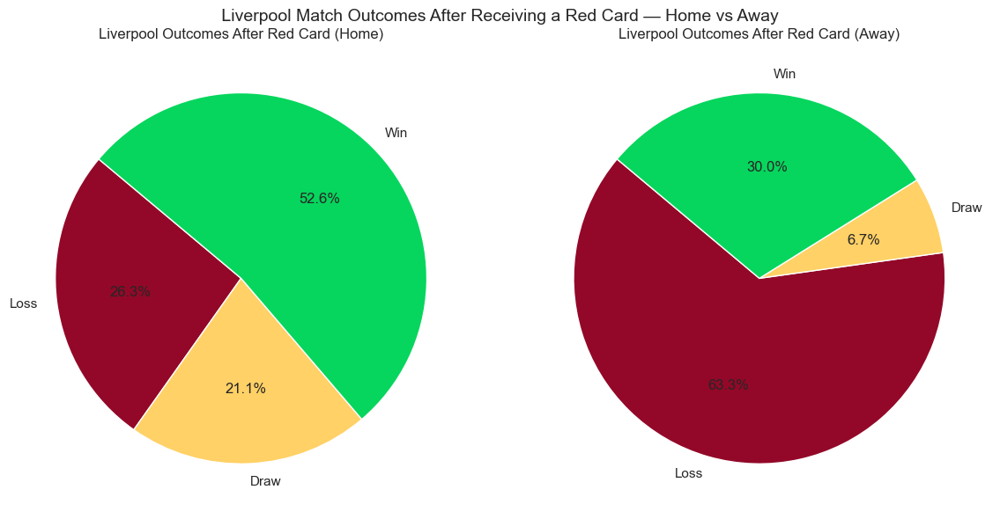

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv("epl_final.csv")

# Filter Liverpool matches
df = df[(df["HomeTeam"] == "Liverpool") | (df["AwayTeam"] == "Liverpool")].copy()

# Flag red cards for Liverpool at Home and Away
df["LFC_HomeRed"] = (df["HomeTeam"] == "Liverpool") & (df["HomeRedCards"] > 0)
df["LFC_AwayRed"] = (df["AwayTeam"] == "Liverpool") & (df["AwayRedCards"] > 0)

# Combine for unified flag
df["LFC_RedCardVenue"] = df.apply(
    lambda row: "Home" if row["LFC_HomeRed"]
    else "Away" if row["LFC_AwayRed"]
    else None,
    axis=1
)

# Filter only red-card matches for Liverpool
lfc_reds = df[df["LFC_RedCardVenue"].notnull()].copy()

# Define match outcome for Liverpool
def get_result(row):
    if row["HomeTeam"] == "Liverpool":
        return "Win" if row["FullTimeResult"] == "H" else "Loss" if row["FullTimeResult"] == "A" else "Draw"
    else:
        return "Win" if row["FullTimeResult"] == "A" else "Loss" if row["FullTimeResult"] == "H" else "Draw"

lfc_reds["LiverpoolResult"] = lfc_reds.apply(get_result, axis=1)

# Set up plots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

colors = ["#930828", "#FFD166", "#06D65D"]
labels = ["Loss", "Draw", "Win"]

for i, venue in enumerate(["Home", "Away"]):
    subset = lfc_reds[lfc_reds["LFC_RedCardVenue"] == venue]
    counts = subset["LiverpoolResult"].value_counts().reindex(labels).fillna(0)
    axes[i].pie(
        counts,
        labels=labels,
        autopct="%1.1f%%",
        colors=colors,
        startangle=140
    )
    axes[i].set_title(f"Liverpool Outcomes After Red Card ({venue})")

plt.suptitle(" Liverpool Match Outcomes After Receiving a Red Card — Home vs Away", fontsize=14)
plt.tight_layout()
plt.show()
# Export red card match outcomes to CSV
lfc_reds[["Season", "LFC_RedCardVenue", "LiverpoolResult"]].to_csv("liverpool_red_card_outcomes.csv", index=False)


In [ ]:
df_copy = df.copy()

# Add total shots faced (shots taken by opponent)
df_copy["ShotsFaced_Home"] = df_copy["AwayShots"]
df_copy["ShotsFaced_Away"] = df_copy["HomeShots"]

df_copy["GoalsConceded_Home"] = df_copy["FullTimeAwayGoals"]
df_copy["GoalsConceded_Away"] = df_copy["FullTimeHomeGoals"]

# Combine for each team
home_def = df_copy.groupby("HomeTeam")[["ShotsFaced_Home", "GoalsConceded_Home"]].sum()
away_def = df_copy.groupby("AwayTeam")[["ShotsFaced_Away", "GoalsConceded_Away"]].sum()

# Total shots faced and goals conceded
team_def = home_def.join(away_def, how="outer").fillna(0)
team_def["TotalShotsFaced"] = team_def["ShotsFaced_Home"] + team_def["ShotsFaced_Away"]
team_def["TotalGoalsConceded"] = (
    team_def["GoalsConceded_Home"] + team_def["GoalsConceded_Away"]
)
team_def["ConcededPerShot"] = (
    team_def["TotalGoalsConceded"] / team_def["TotalShotsFaced"]
)

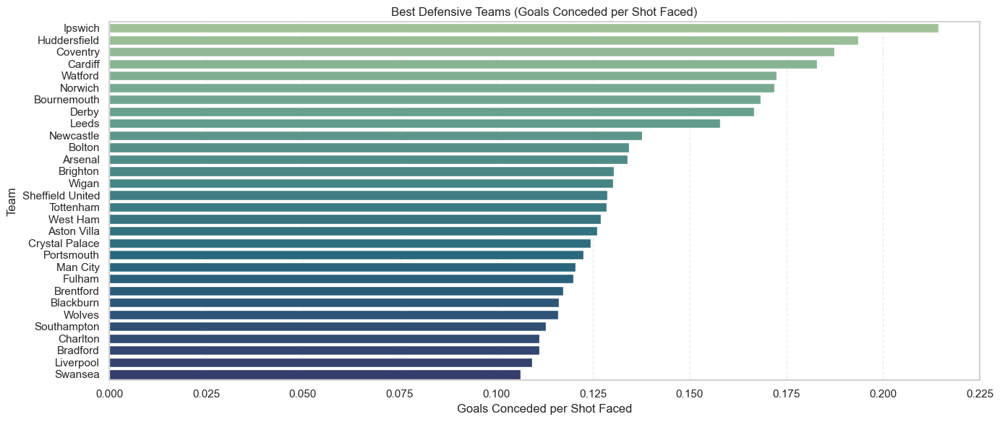

In [ ]:
# Which teams are the most defensively efficient (conceding few goals per shot faced)?

defensive_ranking = team_def.sort_values("ConcededPerShot",ascending=False)

plt.figure(figsize=(14, 6))
sns.barplot(
    x=defensive_ranking["ConcededPerShot"].head(30),
    y=defensive_ranking.head(30).index,
    palette="crest",
)
plt.title("Best Defensive Teams (Goals Conceded per Shot Faced)")
plt.xlabel("Goals Conceded per Shot Faced")
plt.ylabel("Team")
plt.grid(axis="x", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

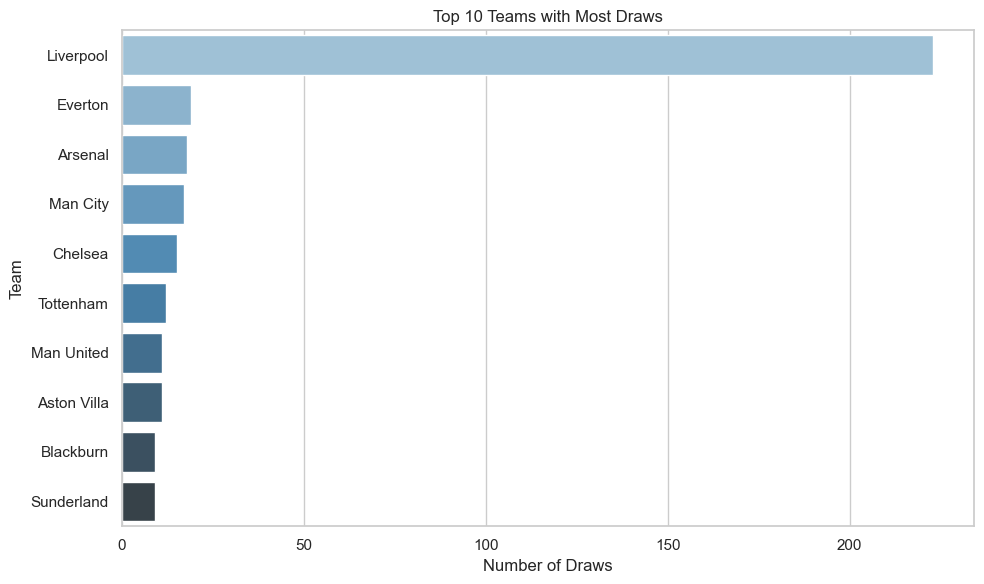

In [ ]:

# Which teams draw the most matches? Are there consistent "draw kings"?

# Count draws at home and away
df_copy["IsDraw"] = df_copy["FullTimeResult"] == "D"
draws = (
    df_copy.groupby("HomeTeam")["IsDraw"].sum()
    + df_copy.groupby("AwayTeam")["IsDraw"].sum()
)
draws = draws.sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=draws.head(10).values, y=draws.head(10).index, palette="Blues_d")
plt.title("Top 10 Teams with Most Draws")
plt.xlabel("Number of Draws")
plt.ylabel("Team")
plt.tight_layout()
plt.show()

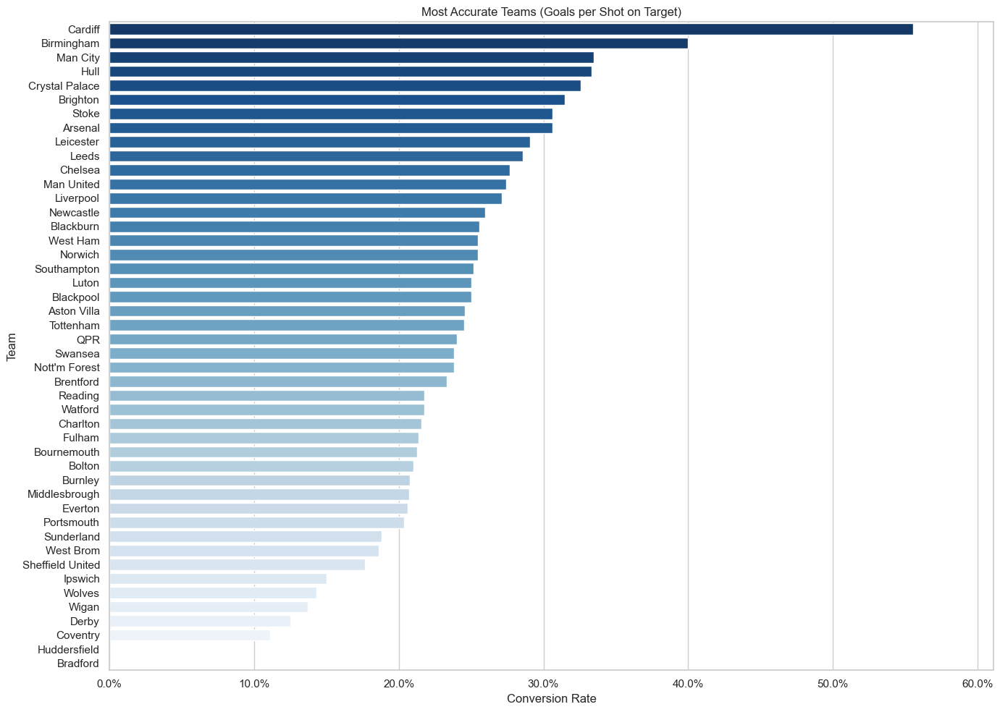

In [ ]:
# Teams Analysis
df_copy = df.copy()

# 1. Define wins
df_copy["HomeWin"] = (df_copy["FullTimeResult"] == "H").astype(int)
df_copy["AwayWin"] = (df_copy["FullTimeResult"] == "A").astype(int)

# 2. Group home stats
home_stats = df_copy.groupby("HomeTeam").agg(
    Goals_Home=("FullTimeHomeGoals", "sum"),
    Shots_Home=("HomeShots", "sum"),
    ShotsOnTarget_Home=("HomeShotsOnTarget", "sum"),
    Fouls_Home=("HomeFouls", "sum"),
    Yellow_Home=("HomeYellowCards", "sum"),
    Red_Home=("HomeRedCards", "sum"),
    Wins_Home=("HomeWin", "sum"),
    Games_Home=("HomeWin", "count"),
)

# 3. Group away stats
away_stats = df_copy.groupby("AwayTeam").agg(
    Goals_Away=("FullTimeAwayGoals", "sum"),
    Shots_Away=("AwayShots", "sum"),
    ShotsOnTarget_Away=("AwayShotsOnTarget", "sum"),
    Fouls_Away=("AwayFouls", "sum"),
    Yellow_Away=("AwayYellowCards", "sum"),
    Red_Away=("AwayRedCards", "sum"),
    Wins_Away=("AwayWin", "sum"),
    Games_Away=("AwayWin", "count"),
)

# 4. Merge and calculate totals
teamStatistics = home_stats.add(away_stats, fill_value=0)
teamStatistics.index.name = "Team"

# 5. Derived columns
teamStatistics["Goals"] = teamStatistics["Goals_Home"] + teamStatistics["Goals_Away"]
teamStatistics["Shots"] = teamStatistics["Shots_Home"] + teamStatistics["Shots_Away"]
teamStatistics["ShotsOnTarget"] = (
    teamStatistics["ShotsOnTarget_Home"] + teamStatistics["ShotsOnTarget_Away"]
)
teamStatistics["Fouls"] = teamStatistics["Fouls_Home"] + teamStatistics["Fouls_Away"]
teamStatistics["Cards"] = (
    teamStatistics["Yellow_Home"]
    + teamStatistics["Red_Home"]
    + teamStatistics["Yellow_Away"]
    + teamStatistics["Red_Away"]
)
teamStatistics["Wins"] = teamStatistics["Wins_Home"] + teamStatistics["Wins_Away"]
teamStatistics["Games"] = teamStatistics["Games_Home"] + teamStatistics["Games_Away"]

# 6. Efficiency & Accuracy ratios
teamStatistics["Goal/ST"] = teamStatistics["Goals"] / teamStatistics["ShotsOnTarget"]
teamStatistics["Wins/Games"] = teamStatistics["Wins"] / teamStatistics["Games"]
teamStatistics["Cards/Fouls"] = teamStatistics["Cards"] / teamStatistics["Fouls"]

# 7. Clean up
teamStatistics = teamStatistics.reset_index()[
    ["Team", "Goal/ST", "Wins/Games", "Cards/Fouls"] + list(teamStatistics.columns)
    ]
teamStatistics = teamStatistics.loc[:, ~teamStatistics.columns.duplicated()]


# Sort by accuracy
goal_on_shots = teamStatistics.sort_values(by="Goal/ST", ascending=False)

plt.figure(figsize=(14, 10))
sns.barplot(data=goal_on_shots, x="Goal/ST", y="Team", palette="Blues_r")

plt.title("Most Accurate Teams (Goals per Shot on Target)")
plt.xlabel("Conversion Rate")
plt.ylabel("Team")
plt.xlim(0, goal_on_shots["Goal/ST"].max() * 1.1)
plt.gca().xaxis.set_major_formatter(
    plt.FuncFormatter(lambda x, _: f"{x:.1%}")
)  # Percent format
plt.tight_layout()
plt.show()

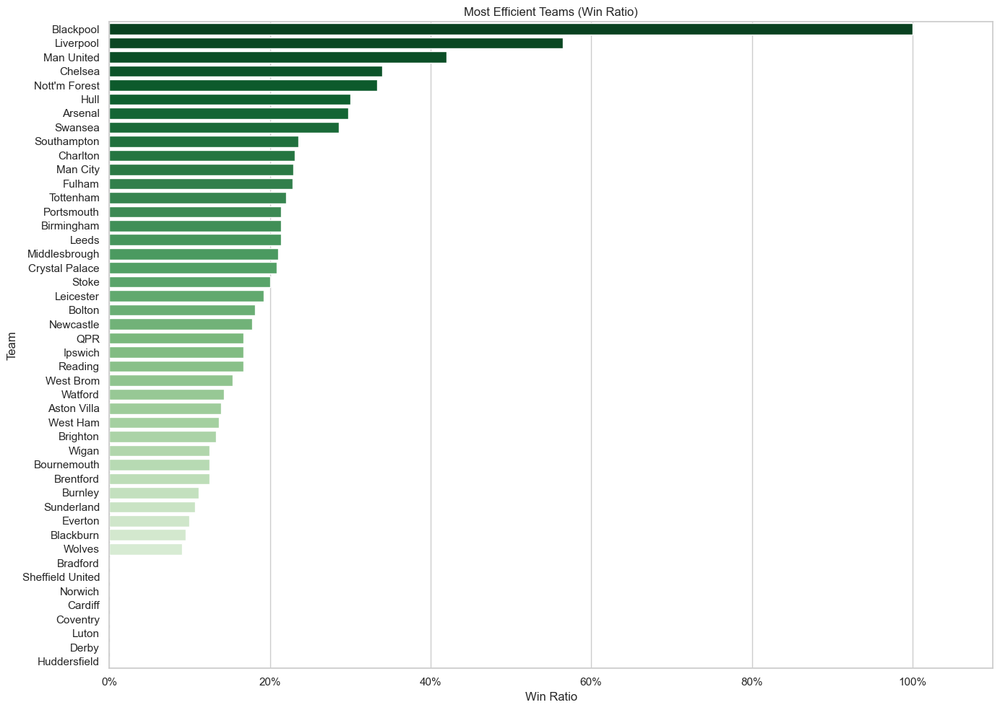

In [ ]:

wins_on_games = teamStatistics.sort_values(by="Wins/Games", ascending=False)

plt.figure(figsize=(14, 10))
sns.barplot(data=wins_on_games, x="Wins/Games", y="Team", palette="Greens_r")

plt.title("Most Efficient Teams (Win Ratio)")
plt.xlabel("Win Ratio")
plt.ylabel("Team")
plt.xlim(0, wins_on_games["Wins/Games"].max() * 1.1)
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
plt.tight_layout()
plt.show()

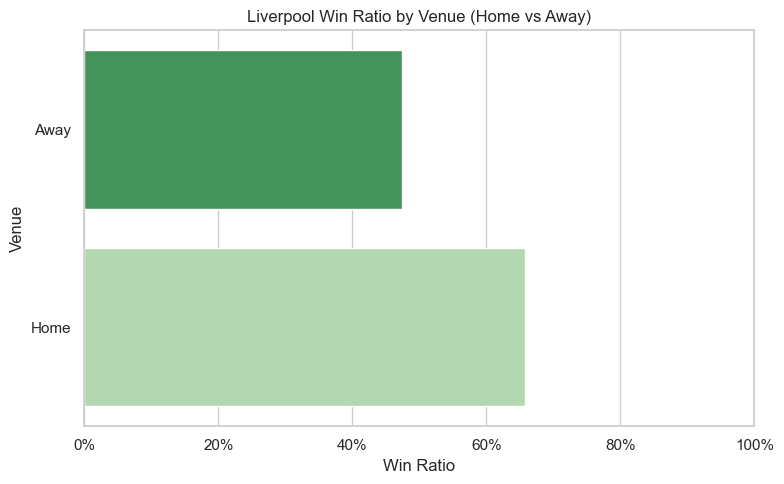

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv("epl_final.csv")

# Filter Liverpool matches
lfc_df = df[(df["HomeTeam"] == "Liverpool") | (df["AwayTeam"] == "Liverpool")].copy()

# Add Venue column
lfc_df["Venue"] = lfc_df["HomeTeam"].apply(lambda x: "Home" if x == "Liverpool" else "Away")

# Determine match result from Liverpool's perspective
def get_result(row):
    if row["HomeTeam"] == "Liverpool":
        return "Win" if row["FullTimeResult"] == "H" else "Draw" if row["FullTimeResult"] == "D" else "Loss"
    else:
        return "Win" if row["FullTimeResult"] == "A" else "Draw" if row["FullTimeResult"] == "D" else "Loss"

lfc_df["Result"] = lfc_df.apply(get_result, axis=1)

# Calculate win ratios for each venue
venue_stats = lfc_df.groupby("Venue")["Result"].value_counts().unstack().fillna(0)
venue_stats["Total"] = venue_stats.sum(axis=1)
venue_stats["Win Ratio"] = venue_stats["Win"] / venue_stats["Total"]

# Prepare for plot
venue_stats_reset = venue_stats.reset_index()

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(data=venue_stats_reset, x="Win Ratio", y="Venue", palette="Greens_r")

plt.title("Liverpool Win Ratio by Venue (Home vs Away)")
plt.xlabel("Win Ratio")
plt.ylabel("Venue")
plt.xlim(0, 1)
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
plt.tight_layout()
plt.show()


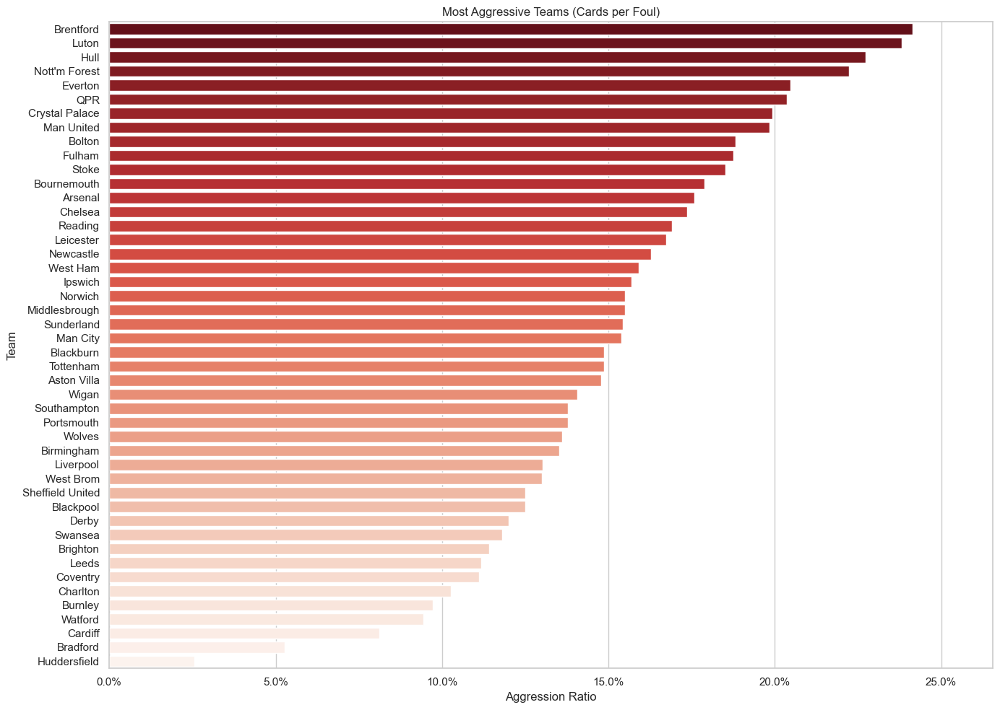

In [ ]:


cards_on_fouls = teamStatistics.sort_values(by="Cards/Fouls", ascending=False)

plt.figure(figsize=(14,10))
sns.barplot(data=cards_on_fouls, x="Cards/Fouls", y="Team", palette="Reds_r")

plt.title("Most Aggressive Teams (Cards per Foul)")
plt.xlabel("Aggression Ratio")
plt.ylabel("Team")
plt.xlim(0, cards_on_fouls["Cards/Fouls"].max() * 1.1)
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.1%}"))
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
match_infos = pd.read_csv("match_infos_EPL_1920.csv")
rosters = pd.read_csv("rosters_EPL_1920.csv")
shots = pd.read_csv("shots_EPL_1920.csv")

# Filter Liverpool-related data
liverpool_matches = match_infos[(match_infos['team_h'] == 'Liverpool') | (match_infos['team_a'] == 'Liverpool')].copy()
liverpool_rosters = rosters[rosters['team_id'] == 87].copy()
liverpool_shots = shots[(shots['h_team'] == 'Liverpool') | (shots['a_team'] == 'Liverpool')].copy()

# Date processing
liverpool_matches["date"] = pd.to_datetime(liverpool_matches["date"])
liverpool_shots["date"] = pd.to_datetime(liverpool_shots["date"])
liverpool_shots["Venue"] = liverpool_shots.apply(lambda row: "Home" if row["h_team"] == "Liverpool" else "Away", axis=1)
liverpool_shots["isGoal"] = liverpool_shots["result"] == "Goal"


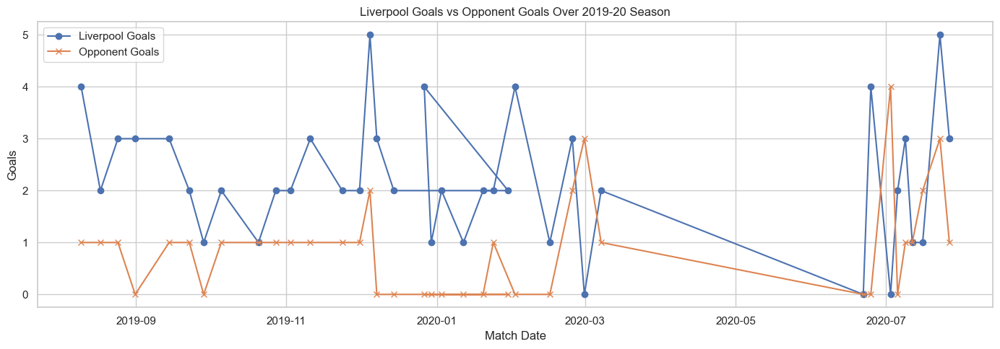

In [ ]:
liverpool_matches["Liverpool Goals"] = liverpool_matches.apply(
    lambda row: row["h_goals"] if row["team_h"] == "Liverpool" else row["a_goals"], axis=1)
liverpool_matches["Opponent Goals"] = liverpool_matches.apply(
    lambda row: row["a_goals"] if row["team_h"] == "Liverpool" else row["h_goals"], axis=1)

plt.figure(figsize=(14, 5))
plt.plot(liverpool_matches["date"], liverpool_matches["Liverpool Goals"], label="Liverpool Goals", marker="o")
plt.plot(liverpool_matches["date"], liverpool_matches["Opponent Goals"], label="Opponent Goals", marker="x")
plt.title("Liverpool Goals vs Opponent Goals Over 2019-20 Season")
plt.xlabel("Match Date")
plt.ylabel("Goals")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


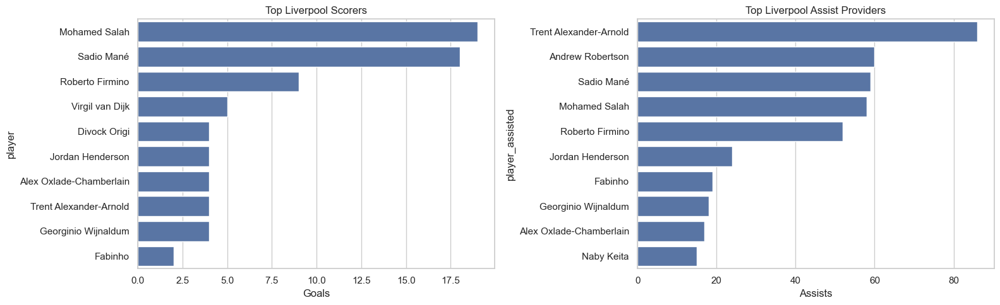

In [ ]:
top_scorers = liverpool_shots[liverpool_shots["result"] == "Goal"].groupby("player")["result"].count().sort_values(ascending=False).head(10)
top_assists = liverpool_shots[liverpool_shots["player_assisted"].notna()].groupby("player_assisted")["id"].count().sort_values(ascending=False).head(10)

fig, axs = plt.subplots(1, 2, figsize=(16, 5))
sns.barplot(x=top_scorers.values, y=top_scorers.index, ax=axs[0])
axs[0].set_title("Top Liverpool Scorers")
axs[0].set_xlabel("Goals")

sns.barplot(x=top_assists.values, y=top_assists.index, ax=axs[1])
axs[1].set_title("Top Liverpool Assist Providers")
axs[1].set_xlabel("Assists")

plt.tight_layout()
plt.show()


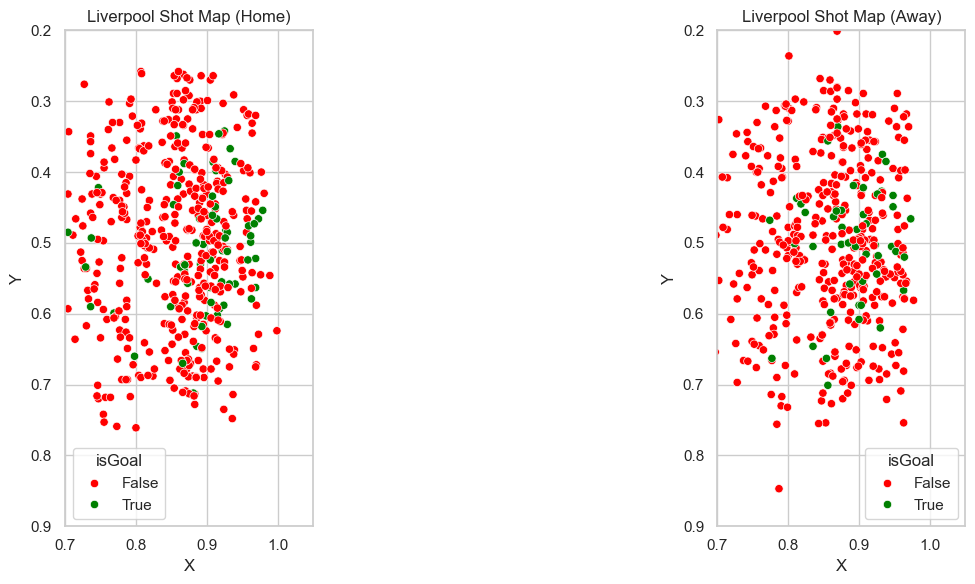

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for ax, df, title in zip(axes, [liverpool_shots[liverpool_shots["Venue"]=="Home"], liverpool_shots[liverpool_shots["Venue"]=="Away"]], ["Home", "Away"]):
    sns.scatterplot(data=df, x="X", y="Y", hue="isGoal", palette={True: "green", False: "red"}, ax=ax)
    ax.set_title(f"Liverpool Shot Map ({title})")
    ax.set_xlim(0.7, 1.05)
    ax.set_ylim(0.2, 0.9)
    ax.set_aspect('equal')
    ax.invert_yaxis()
plt.tight_layout()

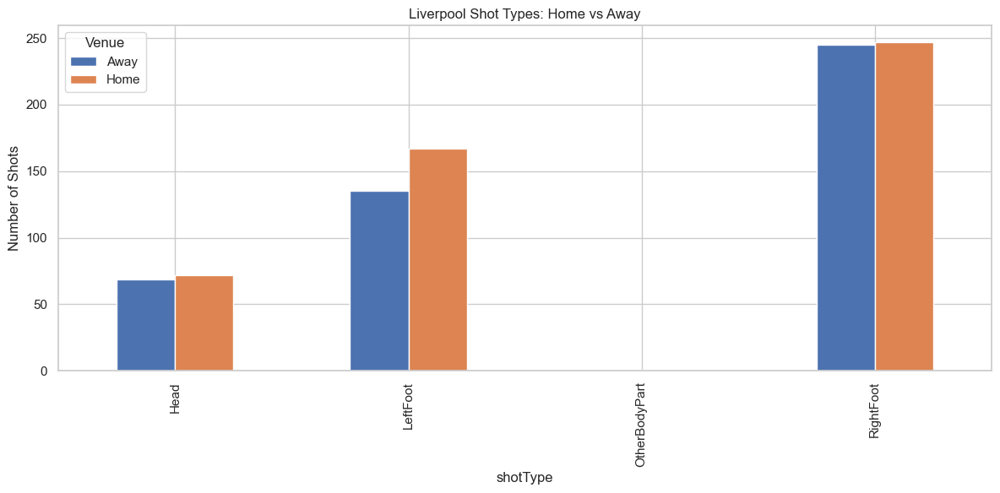

In [ ]:
shot_types = liverpool_shots.groupby(["Venue", "shotType"])["id"].count().unstack().fillna(0)
shot_types.T.plot(kind='bar', figsize=(12, 6))
plt.title("Liverpool Shot Types: Home vs Away")
plt.ylabel("Number of Shots")
plt.tight_layout()
plt.show()


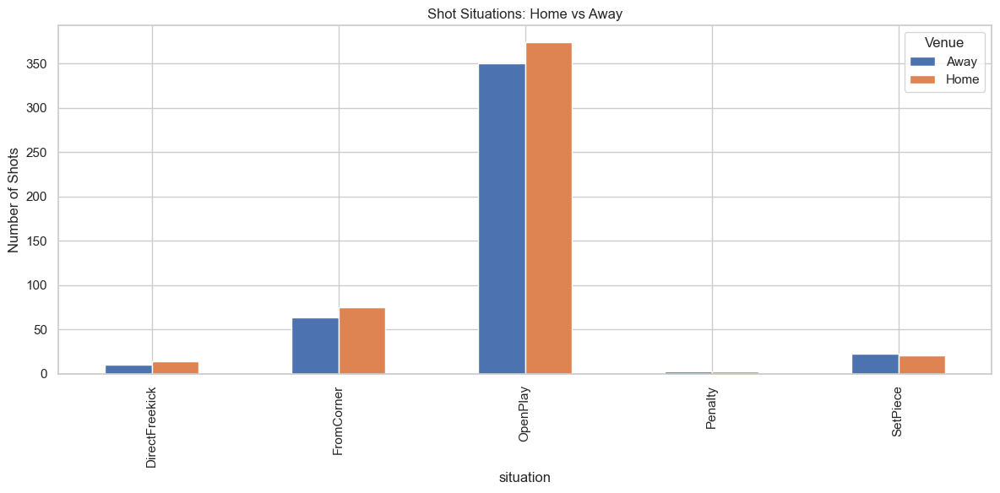

In [ ]:
situations = liverpool_shots.groupby(["Venue", "situation"])["id"].count().unstack().fillna(0)
situations.T.plot(kind='bar', figsize=(12, 6))
plt.title("Shot Situations: Home vs Away")
plt.ylabel("Number of Shots")
plt.tight_layout()
plt.show()


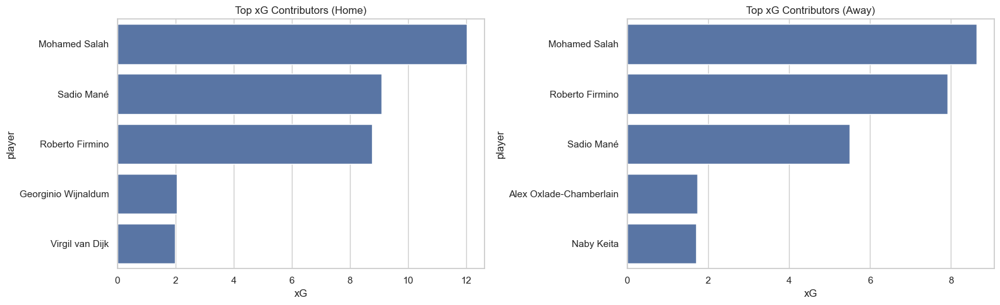

In [ ]:
home_xg = liverpool_shots[liverpool_shots["Venue"] == "Home"].groupby("player")["xG"].sum().sort_values(ascending=False).head(5)
away_xg = liverpool_shots[liverpool_shots["Venue"] == "Away"].groupby("player")["xG"].sum().sort_values(ascending=False).head(5)

fig, axs = plt.subplots(1, 2, figsize=(16, 5))
sns.barplot(x=home_xg.values, y=home_xg.index, ax=axs[0])
axs[0].set_title("Top xG Contributors (Home)")
axs[0].set_xlabel("xG")

sns.barplot(x=away_xg.values, y=away_xg.index, ax=axs[1])
axs[1].set_title("Top xG Contributors (Away)")
axs[1].set_xlabel("xG")

plt.tight_layout()
plt.show()


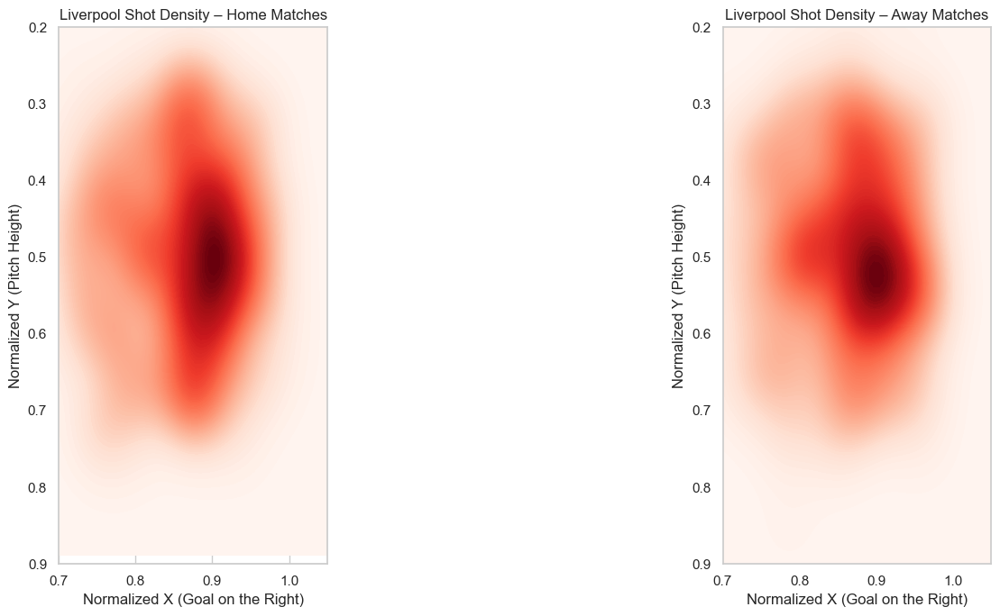

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
shots = pd.read_csv("shots_EPL_1920.csv")

# Filter Liverpool shots
liverpool_shots = shots[(shots["h_team"] == "Liverpool") | (shots["a_team"] == "Liverpool")].copy()

# Add Venue column
liverpool_shots["Venue"] = liverpool_shots.apply(
    lambda row: "Home" if row["h_team"] == "Liverpool" else "Away", axis=1
)

# Plotting heatmaps
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

for ax, venue in zip(axes, ["Home", "Away"]):
    subset = liverpool_shots[liverpool_shots["Venue"] == venue]
    sns.kdeplot(
        data=subset,
        x="X",
        y="Y",
        fill=True,
        thresh=0,
        levels=100,
        cmap="Reds",
        ax=ax
    )
    ax.set_title(f"Liverpool Shot Density – {venue} Matches")
    ax.set_xlim(0.7, 1.05)
    ax.set_ylim(0.2, 0.9)
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.set_xlabel("Normalized X (Goal on the Right)")
    ax.set_ylabel("Normalized Y (Pitch Height)")

plt.tight_layout()
plt.show()


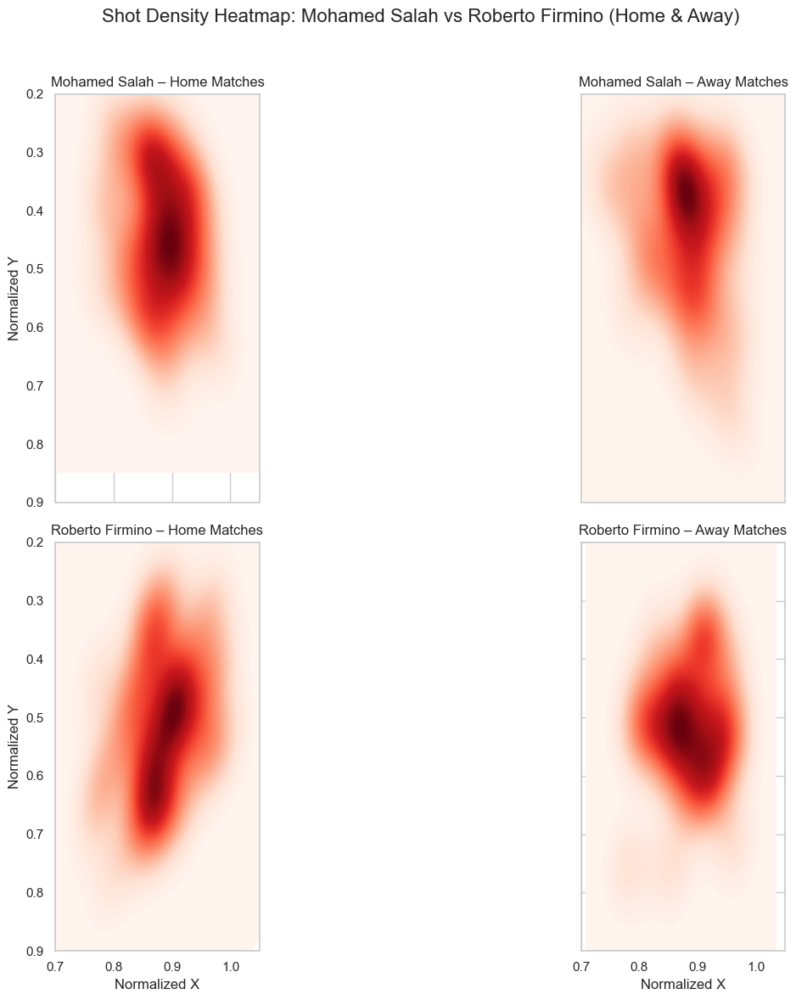

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load shot data
shots = pd.read_csv("shots_EPL_1920.csv")

# Filter Liverpool shots
liverpool_shots = shots[(shots["h_team"] == "Liverpool") | (shots["a_team"] == "Liverpool")].copy()

# Add 'Venue' column
liverpool_shots["Venue"] = liverpool_shots.apply(
    lambda row: "Home" if row["h_team"] == "Liverpool" else "Away", axis=1
)

# Filter for Salah and Firmino
key_players = ["Mohamed Salah", "Roberto Firmino"]
player_shots = liverpool_shots[liverpool_shots["player"].isin(key_players)]

# Plot: 2x2 grid (Home vs Away for each player)
fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharex=True, sharey=True)

for i, player in enumerate(key_players):
    for j, venue in enumerate(["Home", "Away"]):
        subset = player_shots[(player_shots["player"] == player) & (player_shots["Venue"] == venue)]
        ax = axes[i][j]
        sns.kdeplot(
            data=subset,
            x="X",
            y="Y",
            fill=True,
            thresh=0,
            levels=100,
            cmap="Reds",
            ax=ax
        )
        ax.set_title(f"{player} – {venue} Matches", fontsize=12)
        ax.set_xlim(0.7, 1.05)
        ax.set_ylim(0.2, 0.9)
        ax.set_aspect('equal')
        ax.invert_yaxis()
        ax.set_xlabel("Normalized X")
        ax.set_ylabel("Normalized Y")

plt.suptitle("Shot Density Heatmap: Mohamed Salah vs Roberto Firmino (Home & Away)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [ ]:
pip install dash dash-bootstrap-components plotly pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 6.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10/10 [dash-bootstrap-components]tstrap-components]
Note: you may need to restart the kernel to use updated packages.
